![Customer Segmentation Analysis](https://www.corporatevision-news.com/wp-content/uploads/2022/10/Customer-Segmentation.jpg)

# Data Pre-Processing

#### Import Packages and CSV

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.pandas.set_option("display.max_columns", 100)
# Create Dataframe
df = pd.read_csv('marketing_campaign.csv', sep='\t')
# Print shape of dataset
print(df.shape)

(2240, 29)


## Data Cleaning

#### Check Null Values

In [2]:
##these are the features with nan value
features_with_na=[features for features in df.columns if df[features].isnull().sum()>=1]
for feature in features_with_na:
    print(feature,np.round(df[feature].isnull().mean()*100,5), '% missing values')

Income 1.07143 % missing values


In [3]:
# statistics on numerical columns (Null cols)
df[features_with_na].select_dtypes(exclude='object').describe()

,Income
count,2216.000000
mean,52247.251354
std,25173.076661
min,1730.000000
25%,35303.000000
50%,51381.500000
75%,68522.000000
max,666666.000000


### Imputing Null values

* **Impute Median value for Income column**
- **Why we are using Median instead of Mean or Mode?**
    - The median is the most informative measure of central tendency for skewed distributions or distributions with outliers. For example, the median is often used as a measure of central tendency for income distributions, which are generally highly skewed

In [4]:
#Age
df.Income.fillna(df.Income.median(), inplace=True)

### 3.2 Other Data Cleaning steps

**Handling Duplicates**

In [5]:
df.duplicated().sum()

0

**Remove ```Z_CostContact``` and ```Z_Revenue``` columns from the dataset as contains only constant value, therefore doesn't create any variance in the dataset.**


In [6]:
columns_to_drop = ['ID', 'Z_CostContact','Z_Revenue']
for column in columns_to_drop:
    df.drop(column, inplace=True, axis=1)
    print(f"Column {column} is dropped.")

Column ID is dropped.
Column Z_CostContact is dropped.
Column Z_Revenue is dropped.


# Feature Engineering

## Feature Extraction
- We will extract and create some of the meaningfull features.

### We'll repeat some steps from EDA
### The following code creates features that would be helpful to describe the profile of the customer 


In [7]:
# create new column for feature

from datetime import datetime


df = df.copy()

##  creating a new field to store the Age of the customer
df['Age']=2022-df['Year_Birth']   

###  recoding the customer's education level to numeric form (0: high-school, 1: diploma, 2: bachelors, 3: masters, and 4: doctorates)
df["Education"].replace({"Basic":0,"2n Cycle":1, "Graduation":2, "Master":3, "PhD":4},inplace=True)  

#  recoding the customer's marital status to numeric form (0: not living with a partner, 1: living with a partner) 
df['Marital_Status'].replace({"Married":1, "Together":1, "Absurd":0, "Widow":0, "YOLO":0, "Divorced":0, "Single":0,"Alone":0},inplace=True) 

#  creating a new field to store the number of children in the household
df['Children']=df['Kidhome']+df['Teenhome']

#creating Family_Size
df['Family_Size']=df['Marital_Status']+df['Children']+1



#  creating a new field to store the total spending of the customer
df['Total_Spending'] = (df["MntWines"] + df["MntFruits"] + df["MntMeatProducts"] + 
                        df["MntFishProducts"] + df["MntSweetProducts"] + df["MntGoldProds"])
df["Total Promo"] = (df["AcceptedCmp1"] + df["AcceptedCmp2"] + 
                     df["AcceptedCmp3"] + df["AcceptedCmp4"] + df["AcceptedCmp5"])

## The following code works out how long the customer has been with the company and store the total number of promotions the customers responded to
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y', errors='coerce')
today = datetime.today()
df['Days_as_Customer']=(today-df['Dt_Customer']).dt.days
df['Offers_Responded_To']=df['AcceptedCmp1']+df['AcceptedCmp2']+df['AcceptedCmp3']+df['AcceptedCmp4']+df['AcceptedCmp5']+df['Response']
df["Parental Status"] = np.where(df["Children"] > 0, 1, 0)






#dropping columns which are already used to create new features
columns_to_drop = ['Year_Birth','Kidhome','Teenhome']
df.drop(columns = columns_to_drop, axis = 1, inplace=True)
df.rename(columns={"Marital_Status": "Marital Status","MntWines": "Wines","MntFruits":"Fruits",
                   "MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets",
                   "MntGoldProds":"Gold","NumWebPurchases": "Web","NumCatalogPurchases":"Catalog",
                   "NumStorePurchases":"Store","NumDealsPurchases":"Discount Purchases"},
          inplace = True)

df = df[["Age","Education","Marital Status","Parental Status","Children","Income","Total_Spending","Days_as_Customer","Recency","Wines","Fruits","Meat","Fish","Sweets","Gold","Web","Catalog","Store","Discount Purchases","Total Promo","NumWebVisitsMonth"]]

print(df.head())

   Age  Education  Marital Status  Parental Status  Children   Income  \
0   65          2               0                0         0  58138.0   
1   68          2               0                1         2  46344.0   
2   57          2               1                0         0  71613.0   
3   38          2               1                1         1  26646.0   
4   41          4               1                1         1  58293.0   

   Total_Spending  Days_as_Customer  Recency  Wines  Fruits  Meat  Fish  \
0            1617              4556       58    635      88   546   172   
1              27              4006       38     11       1     6     2   
2             776              4205       26    426      49   127   111   
3              53              4032       26     11       4    20    10   
4             422              4054       94    173      43   118    46   

   Sweets  Gold  Web  Catalog  Store  Discount Purchases  Total Promo  \
0      88    88    8       10      4 

### Type of Features

**Numeric Features**

In [8]:
num_features = [feature for feature in df.columns if df[feature].dtype != 'O']
print('Num of Numerical Features :', len(num_features))

Num of Numerical Features : 21


**Categorical Features**

In [9]:
cat_features = [feature for feature in df.columns if df[feature].dtype == 'O']
print('Num of Categorical Features :', len(cat_features))

Num of Categorical Features : 0


**Discrete Features**

In [10]:
discrete_features=[feature for feature in num_features if len(df[feature].unique())<=25]
print('Num of Discrete Features :',len(discrete_features))

Num of Discrete Features : 10


**Continues Features**

In [11]:
continuous_features=[feature for feature in num_features if feature not in discrete_features]
print('Num of Continuous Features :',len(continuous_features))

Num of Continuous Features : 11


 ” VIF determines the strength of the correlation between the independent variables. It is predicted by taking a variable and regressing it against every other variable “ 
 
**- We can see there are some Multicollinearity in this dataset**

### Check Outlier and Capping it

**Why outliers?**
* Data Entry error : Human error. 
* Measurement error: Instrument error. 
* Natural error: it will be Real life data.
* Intentional error: People give wrong inputs

**Impact of Outliers ?**
* Ouliers can very high impact on few Machine learning models.
* Can Cause bias in the output.

**Why IQR For Outlier Handling?**
* For Skewed distributions: Use Inter-Quartile Range (IQR) proximity rule.

* The data points which fall below Q1 – 1.5 IQR or above Q3 + 1.5 IQR are outliers.

* where Q1 and Q3 are the 25th and 75th percentile of the dataset respectively, and IQR represents the inter-quartile range and given by Q3 – Q1.

In [12]:
continuous_features

['Age',
 'Income',
 'Total_Spending',
 'Days_as_Customer',
 'Recency',
 'Wines',
 'Fruits',
 'Meat',
 'Fish',
 'Sweets',
 'Gold']

## Outliers Detection

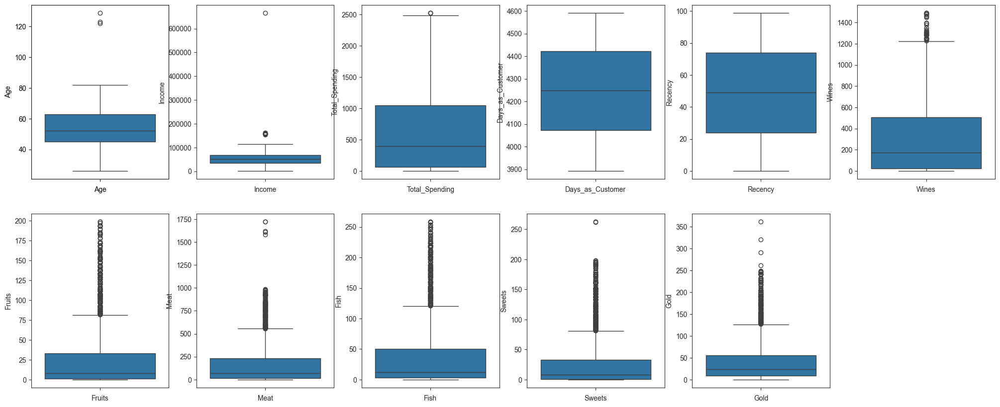

In [13]:
cont_features = continuous_features.copy()
plt.figure(figsize=(25, 10))

for i in range(len(cont_features)):
        plt.subplot(2,6,i+1)
        sns.set_style('ticks')
        plt.xlabel(cont_features[i])
        ax = sns.boxplot(df[cont_features[i]])

**report**
- We can see, there are no such outliers in ```Recency``` and ```Days_as_Customer``` Column
- But there are outliers in following columns - 
    - Income
    - Wines
    - Fruits
    - Meat
    - Fish
    - Sweets
    - Gold
    - Age
    - Total Spending

**Detecting Outlier and Capping it**

In [14]:
def detect_outliers(col):
    # Finding the IQR
    percentile25 = df[col].quantile(0.25)
    percentile75 = df[col].quantile(0.75)
    print('\n ####', col , '####')
    print("percentile25",percentile25)
    print("percentile75",percentile75)
    iqr = percentile75 - percentile25
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr
    print("Upper limit",upper_limit)
    print("Lower limit",lower_limit)
    df.loc[(df[col]>upper_limit), col]= upper_limit
    df.loc[(df[col]<lower_limit), col]= lower_limit    
    return df

**Why are we capping it and why not trim it ?**
* Trimming outliers may result in the removal of a large number of records from this dataset as we have already very less rows so this isn’t desirable in this case since columns other than the ones containing the outlier values may contain useful information.

* In this cases, you can use outlier capping to replace the outlier values with a maximum or minimum capped values. Be warned, this manipulates our data but we can replace outlier values by the upper and lower limit calculated using the IQR range.

In [15]:
for col in continuous_features:
         detect_outliers(col)


 #### Age ####
percentile25 45.0
percentile75 63.0
Upper limit 90.0
Lower limit 18.0

 #### Income ####
percentile25 35538.75
percentile75 68289.75
Upper limit 117416.25
Lower limit -13587.75

 #### Total_Spending ####
percentile25 68.75
percentile75 1045.5
Upper limit 2510.625
Lower limit -1396.375

 #### Days_as_Customer ####
percentile25 4073.75
percentile75 4422.0
Upper limit 4944.375
Lower limit 3551.375

 #### Recency ####
percentile25 24.0
percentile75 74.0
Upper limit 149.0
Lower limit -51.0

 #### Wines ####
percentile25 23.75
percentile75 504.25
Upper limit 1225.0
Lower limit -697.0

 #### Fruits ####
percentile25 1.0
percentile75 33.0
Upper limit 81.0
Lower limit -47.0

 #### Meat ####
percentile25 16.0
percentile75 232.0
Upper limit 556.0
Lower limit -308.0

 #### Fish ####
percentile25 3.0
percentile75 50.0
Upper limit 120.5
Lower limit -67.5

 #### Sweets ####
percentile25 1.0
percentile75 33.0
Upper limit 81.0
Lower limit -47.0

 #### Gold ####
percentile25 9.0
percenti

**Checking Skewness after Outlier Capping**

In [16]:
df[continuous_features].skew(axis=0, skipna=True)

Age                 0.120199
Income              0.090027
Total_Spending      0.860245
Days_as_Customer   -0.015216
Recency            -0.001987
Wines               1.096611
Fruits              1.233953
Meat                1.213585
Fish                1.230822
Sweets              1.213346
Gold                1.111307
dtype: float64

## Feature Transformation

### Scaling 
- **Why we use feature scaling?**
    - the feature scaling was implemented to prevent any skewness in the contour plot of the cost function which affects the gradient descent but the analytical solution using normal equation does not suffer from the same drawback.

- StandardScaler
StandardScaler standardizes a feature by subtracting the mean and then scaling to unit variance. Unit variance means dividing all the values by the standard deviation.

- PowerTransformer
Power transforms are a family of parametric, monotonic transformations that are applied to make data more Gaussian-like. This is useful for modeling issues related to heteroscedasticity (non-constant variance), or other situations where normality is desired.

- ColumnTransformer
Applies transformers to columns of an array or pandas DataFrame. This estimator allows different columns or column subsets of the input to be transformed separately and the features generated by each transformer will be concatenated to form a single feature space.

- SimpleImputer
SimpleImputer is a scikit-learn class which is helpful in handling the missing data in the predictive model dataset. It replaces the NaN values with a specified placeholder.

- Pipeline
The purpose of the pipeline is to assemble several steps that can be cross-validated together while setting different parameters. For this, it enables setting parameters of the various steps using their names and the parameter name separated by a '__' .

In [17]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
outlier_features = ["Wines","Fruits","Meat","Fish","Sweets","Gold","Age","Total_Spending"] #we can find the columns which has oitliers in the EDA
numeric_features = [x for x in numeric_features if x not in outlier_features]

In [18]:
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline




dataC = df.copy()

numeric_pipeline = Pipeline(steps=
                            [("Imputer", SimpleImputer(strategy='constant', fill_value=0)), 
                             ("StandardScaler", StandardScaler())]
                           )

outlier_features_pipeline = Pipeline(steps=
                                     [("Imputer", SimpleImputer(strategy='constant', fill_value=0)),
                                      ("transformer", PowerTransformer(standardize=True))]
                                    )

preprocessor = ColumnTransformer(
    [
        ("numeric pipeline",numeric_pipeline, numeric_features),
        ("Outliers Features Pipeline", outlier_features_pipeline, outlier_features)
    ]
)

columns = dataC.columns
dataC = preprocessor.fit_transform(dataC)
scaled_data = pd.DataFrame(dataC, columns= columns )
print("After scaling, let's have a glimpse of the scaled dataset :")
scaled_data.head()

After scaling, let's have a glimpse of the scaled dataset :


,Age,Education,Marital Status,Parental Status,Children,Income,Total_Spending,Days_as_Customer,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,Web,Catalog,Store,Discount Purchases,Total Promo,NumWebVisitsMonth
0,-0.458383,-1.346874,-1.584605,-1.264505,0.299651,1.531185,0.307039,1.409304,2.510890,-0.550785,0.349414,-0.439037,0.693904,1.062784,1.487681,1.504406,1.493989,1.474200,1.196801,1.005341,1.315365
1,-0.458383,-1.346874,0.631072,1.396361,-0.263808,-1.190545,-0.383664,-1.110409,-0.568720,-1.166125,-0.168236,-0.439037,-0.130463,-1.211545,-1.001121,-1.376502,-0.889143,-0.987648,-0.967034,1.239521,-1.441417
2,-0.458383,0.742460,-1.584605,-1.264505,0.943420,-0.205773,-0.798086,1.409304,-0.226541,1.295237,-0.685887,-0.439037,-0.542647,0.748918,1.145877,0.456428,1.435812,0.579704,0.473642,0.361223,0.661170
3,-0.458383,0.742460,0.631072,0.065928,-1.204881,-1.061881,-0.798086,-0.750450,-0.910898,-0.550785,-0.168236,-0.439037,0.281720,-1.211545,-0.403311,-0.722233,-0.110828,-0.542753,-1.069040,-1.315014,-1.117211
4,1.533425,0.742460,0.631072,0.065928,0.307056,-0.953012,1.550305,0.329427,0.115638,0.064556,1.384715,-0.439037,-0.130463,0.123712,1.058075,0.406278,0.832291,0.741799,-0.368949,-1.033428,0.179322


### Model Building ( Clustering )


### Create a function for Silhouette score plot

In [19]:
# this function we take it from sklearn page for ploting silhouette with little Modification 
#ploting silhouette_plot aside with clustring results in PCA
from sklearn.metrics import silhouette_score,silhouette_samples
from matplotlib import cm

def silhouette_plot(model,range_n_clusters,X_clustering,pca,**kwargs):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_clustering) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = model(n_clusters,**kwargs)
        cluster_labels = clusterer.fit_predict(X_clustering)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X_clustering, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_clustering, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.2,-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
    #     colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

        sns.scatterplot(
            x = pca[:, 0],
            y = pca[:, 1],
            hue=cluster_labels,
            palette=sns.color_palette("colorblind", len(set(cluster_labels))),
            alpha=0.7,
            legend="full",
            ax = ax2
        )
        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            f"Silhouette analysis for {model.__name__} clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

## PCA (Principal Component Analysis)

In [20]:
#Applying PCA
from sklearn.decomposition import PCA
df_scaled = scaled_data.copy()
var_ratio={}
for n in range(2,18):
    pc=PCA(n_components=n)
    df_pca=pc.fit(df_scaled)
    var_ratio[n]=sum(df_pca.explained_variance_ratio_)

### Choosing PCA` n_components` and Kmeans `n_clusters` based on Clustering metrics

In [21]:
# apply PCA and display clustering metrics
from sklearn.cluster import KMeans
for y in range(2, 8):
    print("PCA with # of components: ", y)
    pca = PCA(n_components=y)
    data_p = pca.fit_transform(df_scaled)
    for x in range(2, 7):
        kmeans = KMeans(n_clusters = x,)
        label = kmeans.fit_predict(data_p)
        print('Silhouette-Score for', x,  'Clusters: ', silhouette_score(data_p, label) , '-  Inertia: ',kmeans.inertia_)
    print()

PCA with # of components:  2
Silhouette-Score for 2 Clusters:  0.5284520578344255 -  Inertia:  9060.368532952742
Silhouette-Score for 3 Clusters:  0.5102088251349817 -  Inertia:  5130.3411203714
Silhouette-Score for 4 Clusters:  0.4548839750986013 -  Inertia:  3980.6654829933623
Silhouette-Score for 5 Clusters:  0.4398022389742095 -  Inertia:  3311.9928563189983
Silhouette-Score for 6 Clusters:  0.3763883170817316 -  Inertia:  2872.435112155285

PCA with # of components:  3
Silhouette-Score for 2 Clusters:  0.45453070032792725 -  Inertia:  12743.398044184265
Silhouette-Score for 3 Clusters:  0.40649011357842824 -  Inertia:  8794.907862162021
Silhouette-Score for 4 Clusters:  0.3330923549295886 -  Inertia:  7454.485751520538
Silhouette-Score for 5 Clusters:  0.3157236958413548 -  Inertia:  6299.840593926007
Silhouette-Score for 6 Clusters:  0.31667365921346147 -  Inertia:  5714.968251396137

PCA with # of components:  4
Silhouette-Score for 2 Clusters:  0.4174324113750855 -  Inertia:  1

**Report**
* **We can go with PCA with 2 components.**
* **We can go with Kmeans Clusters in the range of 4-6 as it has Good score with lesser Inertia compared to others**

In [22]:
# Reducing the dimensions of the data 
pca_final=PCA(n_components=2,random_state=42).fit(df_scaled)

reduced=pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced) 
pcadf.columns = ['PC1', 'PC2'] 
  
pcadf.head(10)

,PC1,PC2
0,4.130751,0.501059
1,-3.495848,-0.524323
2,3.032352,-0.850799
3,-2.794852,-1.108400
4,0.786683,0.794184
5,1.105611,0.968065
6,1.539503,1.352260
7,-1.842628,0.488612
8,-3.457028,-0.155012
9,-5.229958,1.478703


##### The explained variance ratio is the percentage of variance that is attributed by each of the selected components.

In [23]:
pca_final.explained_variance_ratio_

array([0.39488178, 0.10833485])

#### Elbow Method to find best Clusters for K-Means
- In the Elbow method, we are actually varying the number of clusters ( K ) from 1 – 10. For each value of K, we are calculating WCSS ( Within-Cluster Sum of Square ). WCSS is the sum of squared distance between each point and the centroid in a cluster. When we plot the WCSS with the K value, the plot looks like an Elbow. As the number of clusters increases, the WCSS value will start to decrease. WCSS value is largest when K = 1. When we analyze the graph we can see that the graph will rapidly change at a point and thus creating an elbow shape.

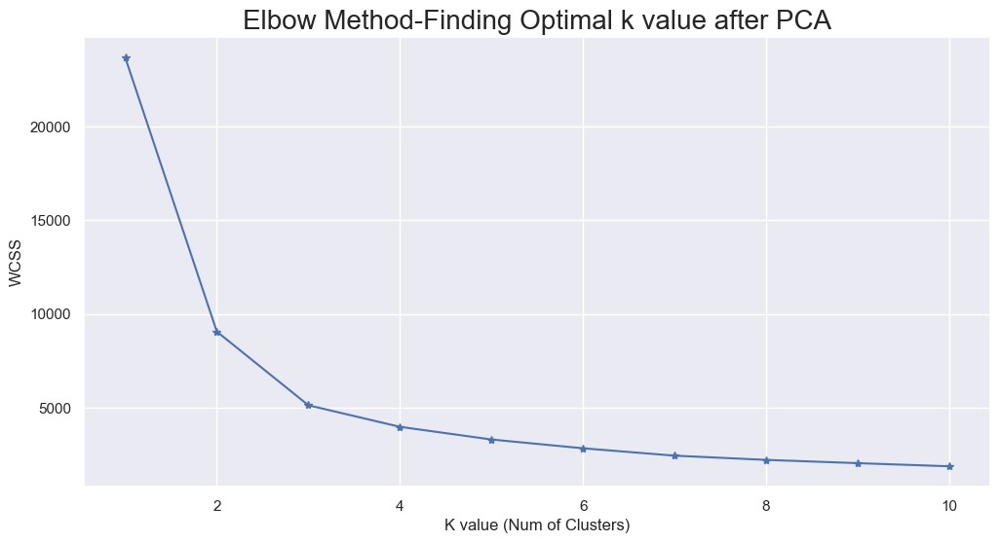

In [24]:
wcss= {}
sns.set()
plt.figure(figsize=(12,6))
for i in range(1,11): 
    km = KMeans(n_clusters=i)
    km.fit(pcadf)
    wcss[i]=km.inertia_

plt.plot(range(1,11),wcss.values(), marker='*')
plt.title('Elbow Method-Finding Optimal k value after PCA', fontsize =20)
plt.xlabel('K value (Num of Clusters)')
plt.ylabel('WCSS')
plt.show()

- Here the optimum number of cluster is 3 cluster since it is the place where the graph start to flatten out meaning that having higher number of cluster will not yield a much more fitting machine.

**Reports:**

* We will use **k = 3**, thus there will be **three clusters** in our dataset.
* We will use **KMeans Algorithm** for clustering.

#### Silhoutte Score Plot for K-Means to choose best number of clusters

For n_clusters = 3 The average silhouette_score is : 0.5102868769089064
For n_clusters = 4 The average silhouette_score is : 0.45277333714656554
For n_clusters = 5 The average silhouette_score is : 0.43525877920277684
For n_clusters = 6 The average silhouette_score is : 0.39550525844249496


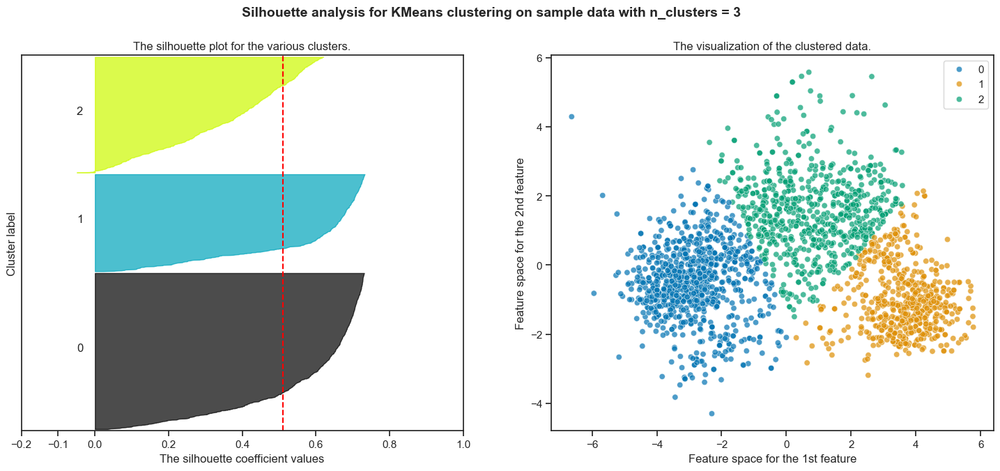

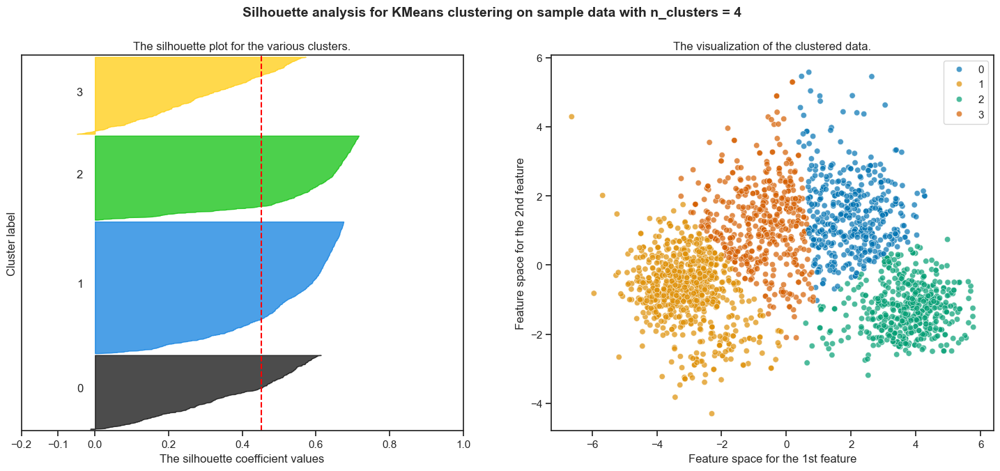

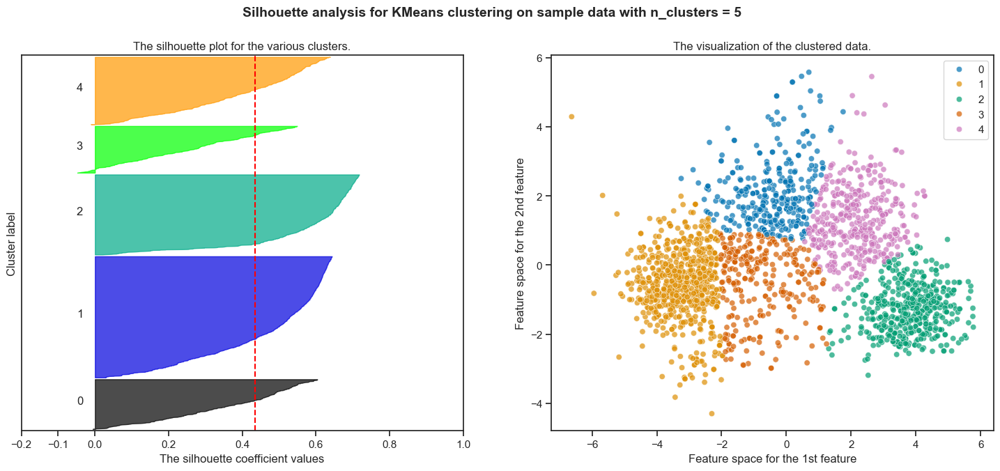

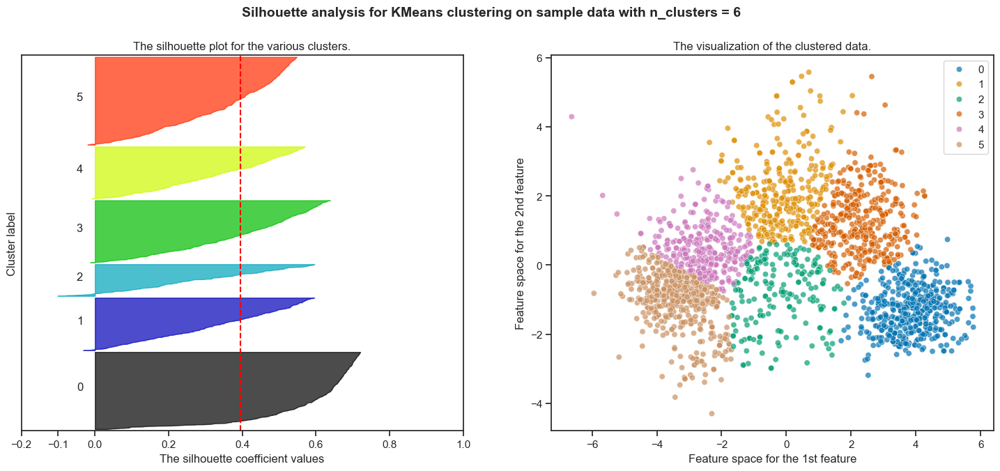

In [25]:


# We plot silhoutte score for Kmeans
# Here pcadf is pca dataframe, and Reduced is array of data after PCA.
sns.set_style('ticks')
silhouette_plot(KMeans,range(3,7), pcadf, reduced)

#### For n_clusters = 3 The average silhouette_score is : 0.5104
#### For n_clusters = 4 The average silhouette_score is : 0.4565
#### For n_clusters = 5 The average silhouette_score is : 0.42996
#### For n_clusters = 6 The average silhouette_score is : 0.390


**Conclusions**
* Clusters of 3 has good balance of Inertia and Shilloute score, we can go with with 3 clusters.


### Apply Kmeans Clustering with 3 clusters

In [26]:
# Fitting the model to reduced data
model = KMeans(n_clusters=3).fit(pcadf)
model_label = model.labels_
model_centers = model.cluster_centers_

In [27]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score

# Davies-Bouldin Index
db_index = davies_bouldin_score(pcadf, model_label)
print("Davies-Bouldin Index:", db_index)

# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(pcadf, model_label)
print("Calinski-Harabasz Index:", ch_index)

# Silhouette Score
sil_score = silhouette_score(pcadf, model_label)
print("Silhouette Score:", sil_score)

Davies-Bouldin Index: 0.7016973830614482
Calinski-Harabasz Index: 4042.2667498267265
Silhouette Score: 0.5102868769089064


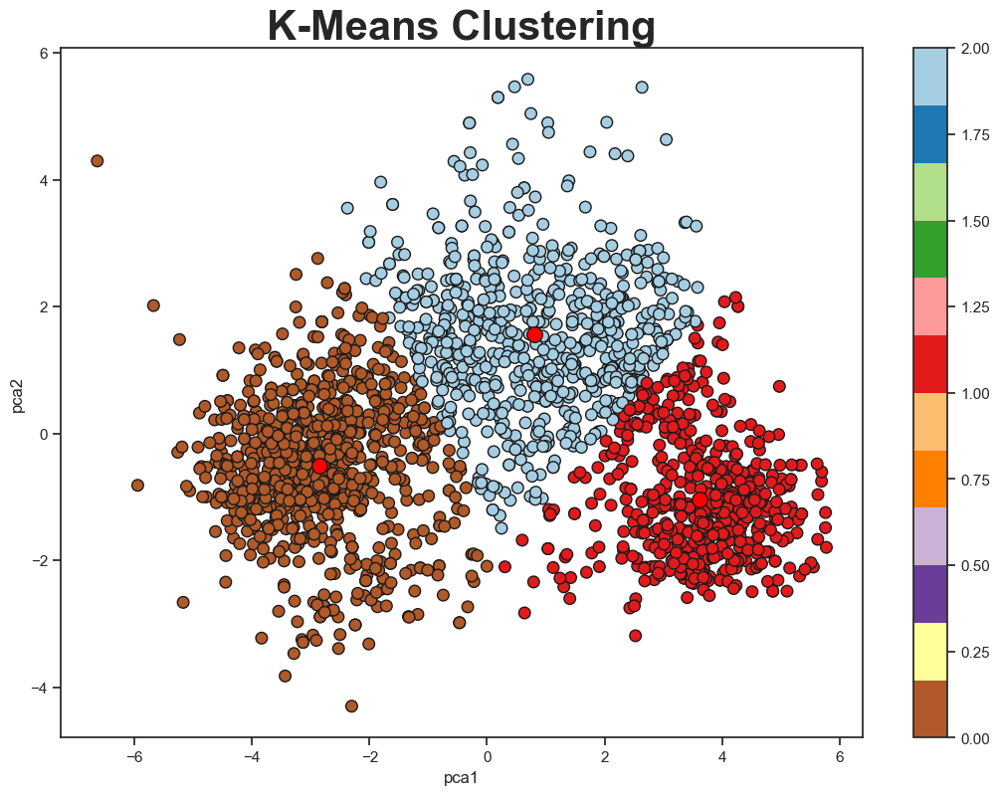

In [28]:
#Plotting the clusters
plt.figure(figsize=(13,9))
plt.title('K-Means Clustering', weight='bold', size=30)
plt.xlabel('pca1')
plt.ylabel('pca2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=70, cmap='Paired_r', ec='k')
plt.colorbar(scatter)
plt.scatter(model_centers[:,0], model_centers[:,1], c='red', marker='.',s=500, ec='k');

### Hierarchical clustering (Agglomerative)


#### Silhoutte Score Plot for Agglomerative Clustering to choose best number of clusters

For n_clusters = 3 The average silhouette_score is : 0.4731726612944978
For n_clusters = 4 The average silhouette_score is : 0.43908681362953433
For n_clusters = 5 The average silhouette_score is : 0.4165290795347633
For n_clusters = 6 The average silhouette_score is : 0.3936313189545478
For n_clusters = 7 The average silhouette_score is : 0.3896956270745404


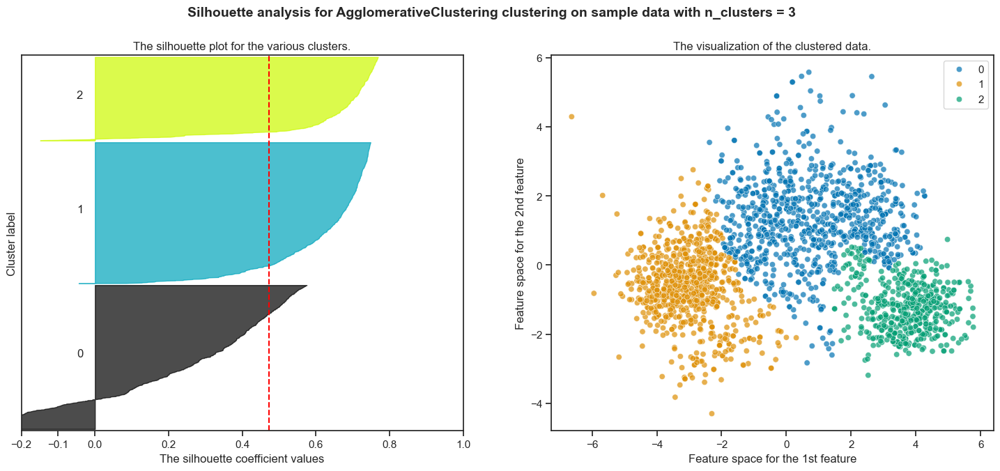

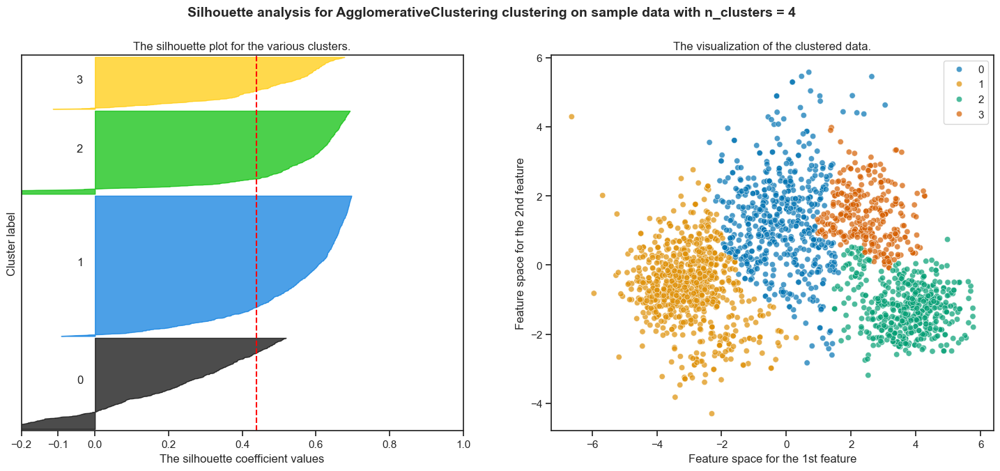

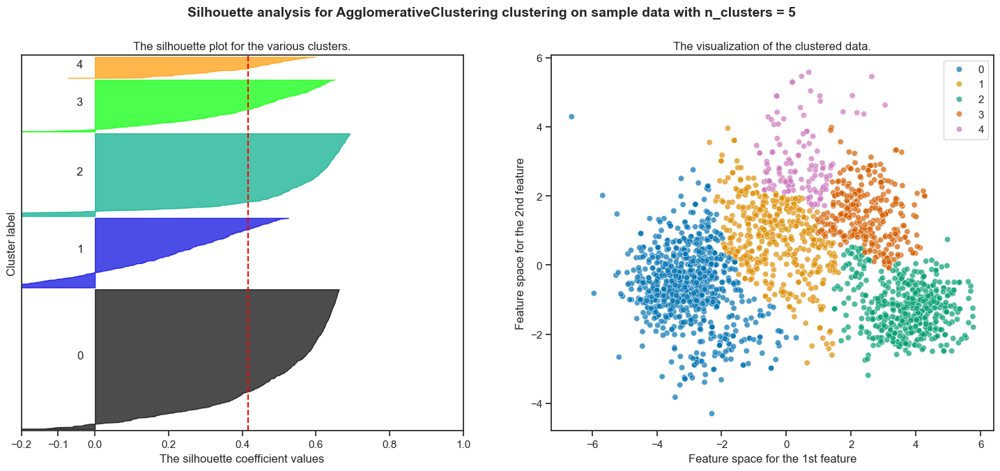

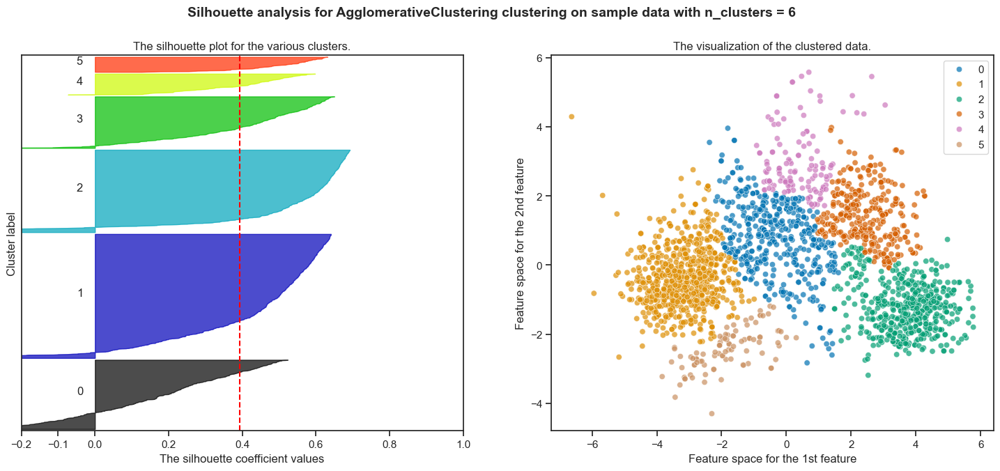

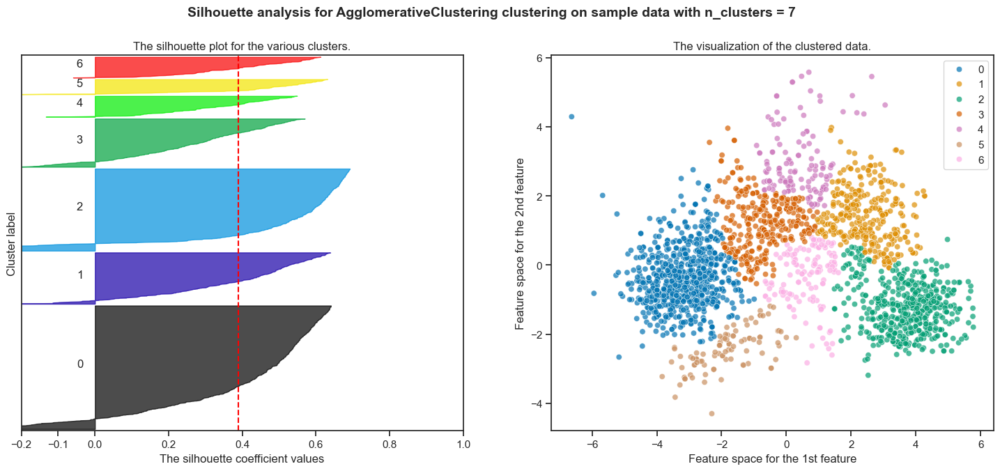

In [29]:
from sklearn.cluster import AgglomerativeClustering
silhouette_plot(AgglomerativeClustering,range(3,8),pcadf,reduced)

#### Visualization of Agglomerative Clustering

best average silhouette_score is : 0.479

### For n_clusters = 3 The average silhouette_score is : 0.4793304219958075
### for n_clusters = 4 The average silhouette_score is : 0.4422221719419182
### for n_clusters = 5 The average silhouette_score is : 0.44374523677707167
### for n_clusters = 6 The average silhouette_score is : 0.37663609855276475
### for n_clusters = 7 The average silhouette_score is : 0.38077029061500806


**Conclusions**
* Clusters of 3 has good balance of Inertia and Shilloute score, we can go with with 3 clusters.


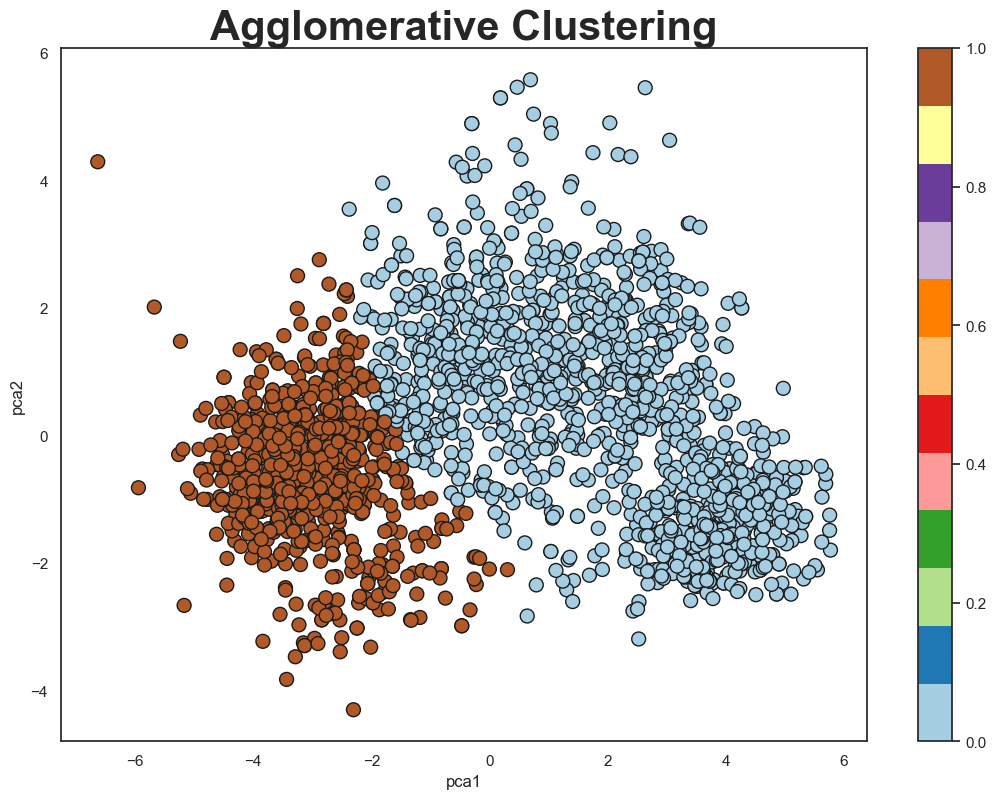

In [30]:
model = AgglomerativeClustering(n_clusters=2, metric='euclidean', linkage='ward').fit(reduced)
model_label = model.labels_

plt.figure(figsize=(13, 9))
sns.set_style('white')

plt.title('Agglomerative Clustering', weight='bold', size=30)
plt.xlabel('pca1')
plt.ylabel('pca2')

scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'], 
    c=model_label, s=100, cmap='Paired', edgecolor='k'
)

plt.colorbar(scatter)
plt.show()

In [31]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score

# Davies-Bouldin Index
db_index = davies_bouldin_score(reduced, model_label)
print("Davies-Bouldin Index:", db_index)

# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(reduced, model_label)
print("Calinski-Harabasz Index:", ch_index)

# Silhouette Score
sil_score = silhouette_score(reduced, model_label)
print("Silhouette Score:", sil_score)

Davies-Bouldin Index: 0.7050305313642374
Calinski-Harabasz Index: 2791.1055958823554
Silhouette Score: 0.4812347065596157


**Report**
* Agglomerative clustering performed well than K means clustering.
* The best Silhoutte score is 0.46, were as K means had 0.44 Silhoutte score.

## Gaussian Mixture

For n_clusters = 3 The average silhouette_score is : 0.47682993846850813
For n_clusters = 4 The average silhouette_score is : 0.445724221517597
For n_clusters = 5 The average silhouette_score is : 0.43944240210631563
For n_clusters = 6 The average silhouette_score is : 0.34399941243450544
For n_clusters = 7 The average silhouette_score is : 0.40634464108842666


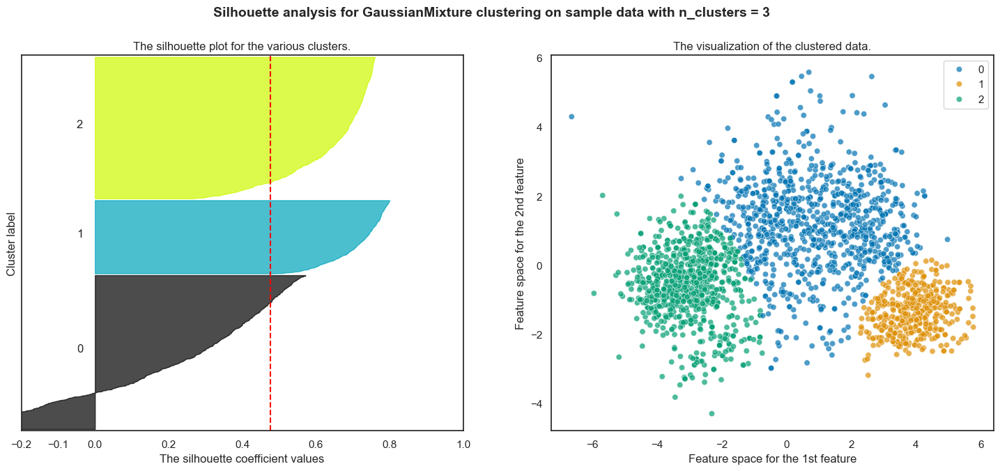

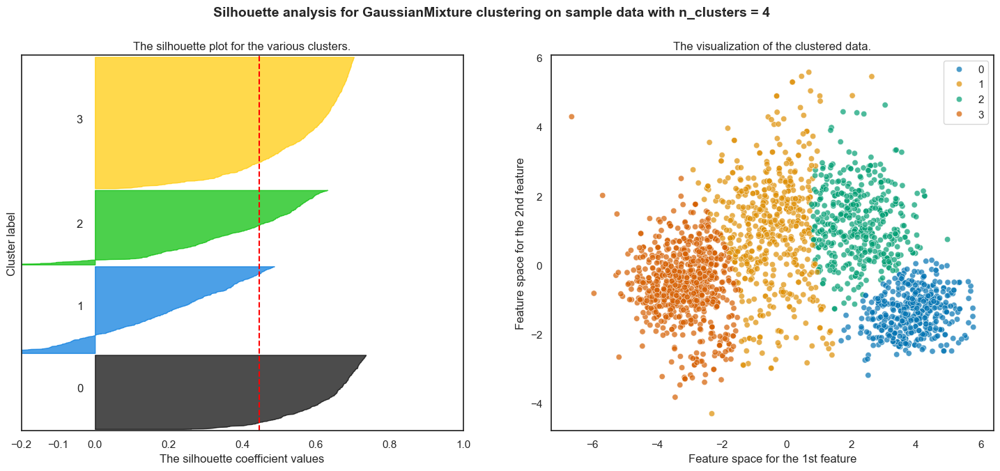

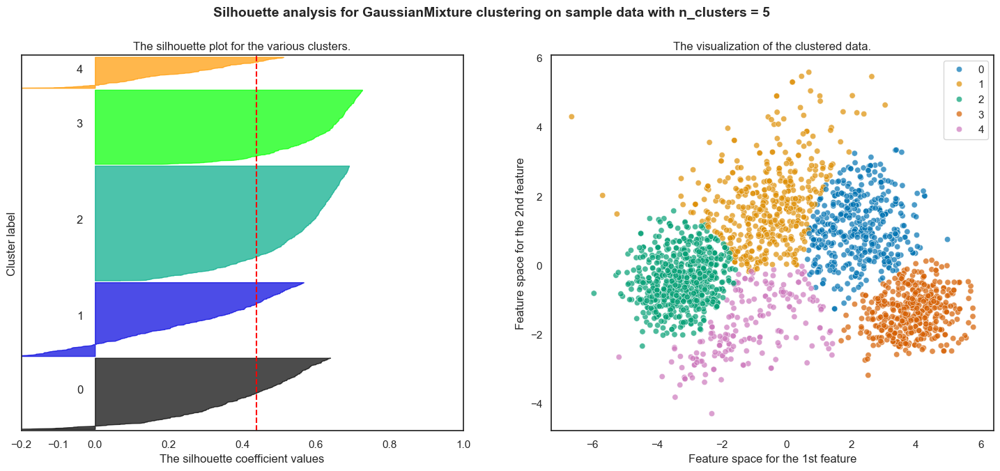

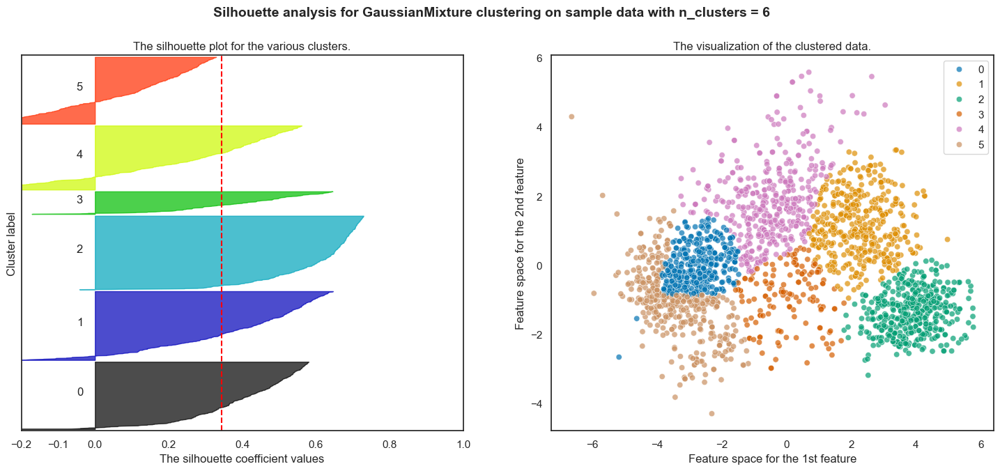

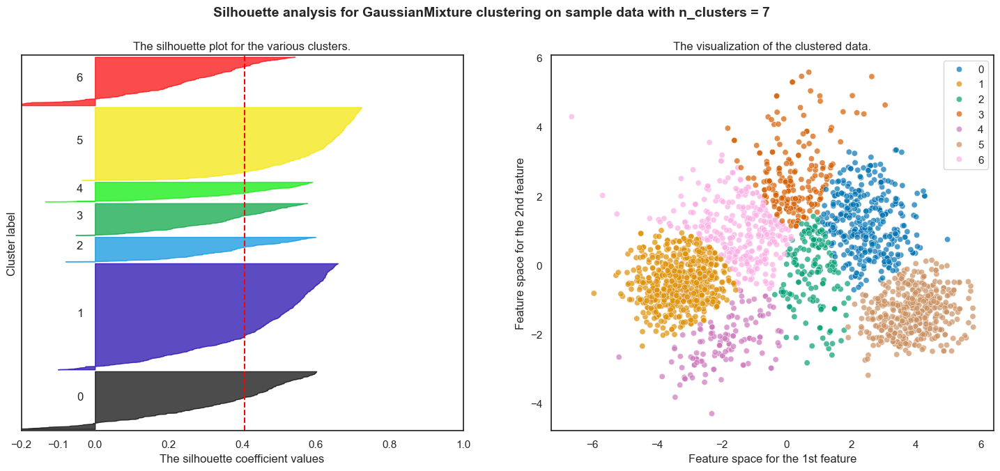

In [32]:
#plotting silhoutte score for Gaussian score
from sklearn.mixture import GaussianMixture
silhouette_plot(GaussianMixture,range(3,8),pcadf,reduced)

### for Gaussian Mixture
#### For n_clusters = 3 The average silhouette_score is : 0.47

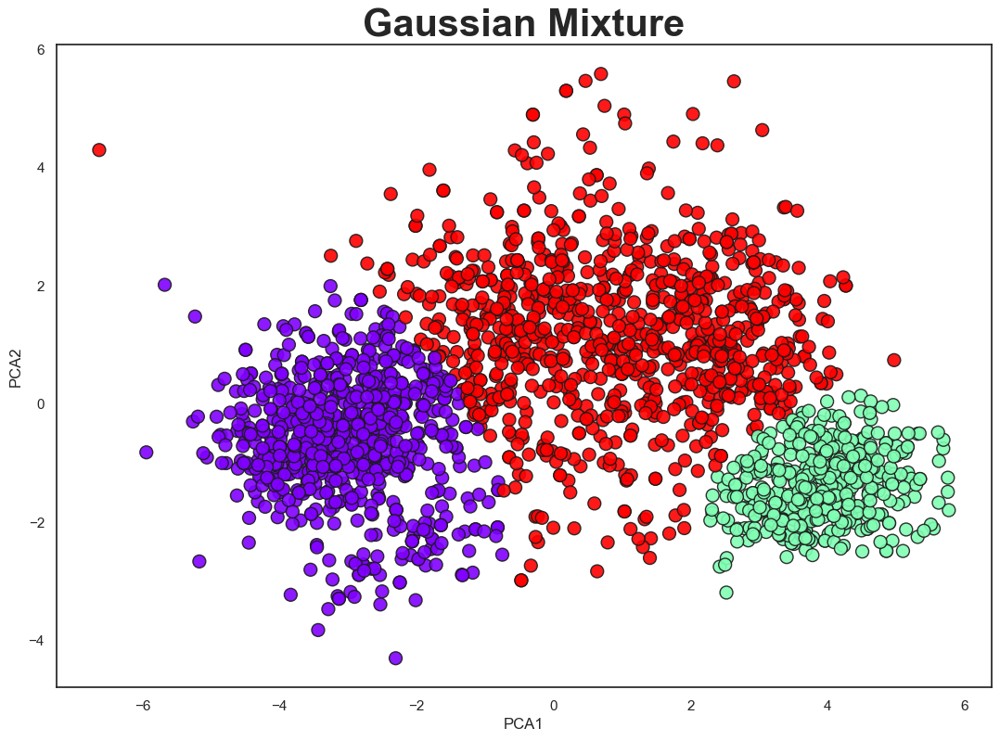

In [33]:
#plotting gaussian mixture with 4 clusters
model = GaussianMixture(n_components=3,random_state=42).fit(reduced)
model_label = model.predict(reduced)
plt.figure(figsize=(13,9))

sns.set_style('white')
plt.title('Gaussian Mixture', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=100, cmap='rainbow', ec='k', alpha=0.9)

In [34]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score

# Davies-Bouldin Index
db_index = davies_bouldin_score(reduced, model_label)
print("Davies-Bouldin Index:", db_index)

# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(reduced, model_label)
print("Calinski-Harabasz Index:", ch_index)

# Silhouette Score
sil_score = silhouette_score(reduced, model_label)
print("Silhouette Score:", sil_score)


Davies-Bouldin Index: 0.6898125274351768
Calinski-Harabasz Index: 3463.1796537286573
Silhouette Score: 0.47682993846850813


### Bayesian Gaussian Mixture Models (BGMM)

For n_clusters = 3 The average silhouette_score is : 0.47414719019658275
For n_clusters = 4 The average silhouette_score is : 0.38457556532377546
For n_clusters = 5 The average silhouette_score is : 0.3901998375479634
For n_clusters = 6 The average silhouette_score is : 0.37501034545799694
For n_clusters = 7 The average silhouette_score is : 0.3728219455856754


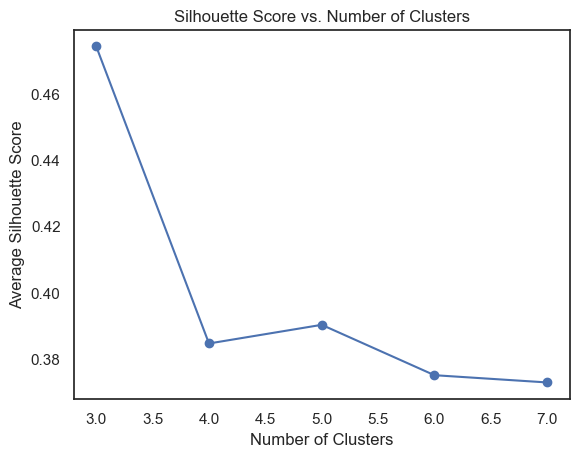

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import BayesianGaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

def silhouette_plot(model_class, n_components_range, X, reduced):
    silhouette_scores = []
    
    for n_components in n_components_range:
        model = model_class(n_components=n_components)
        cluster_labels = model.fit_predict(X)
        
        # Calculate the silhouette score
        score = silhouette_score(X, cluster_labels)
        silhouette_scores.append(score)
        
        # Print the average silhouette score for this number of clusters
        print(f"For n_clusters = {n_components} The average silhouette_score is : {score}")
        
    # Plot silhouette scores
    plt.plot(n_components_range, silhouette_scores, marker='o', color='b')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Average Silhouette Score')
    plt.title('Silhouette Score vs. Number of Clusters')
    plt.show()

silhouette_plot(BayesianGaussianMixture, range(3,8), pcadf, reduced)

In [36]:
from sklearn.mixture import BayesianGaussianMixture

# Applying Bayesian Gaussian Mixture Model
bgmm = BayesianGaussianMixture(n_components=3, random_state=42)
bgmm.fit(reduced)
bgmm_labels = bgmm.predict(reduced)

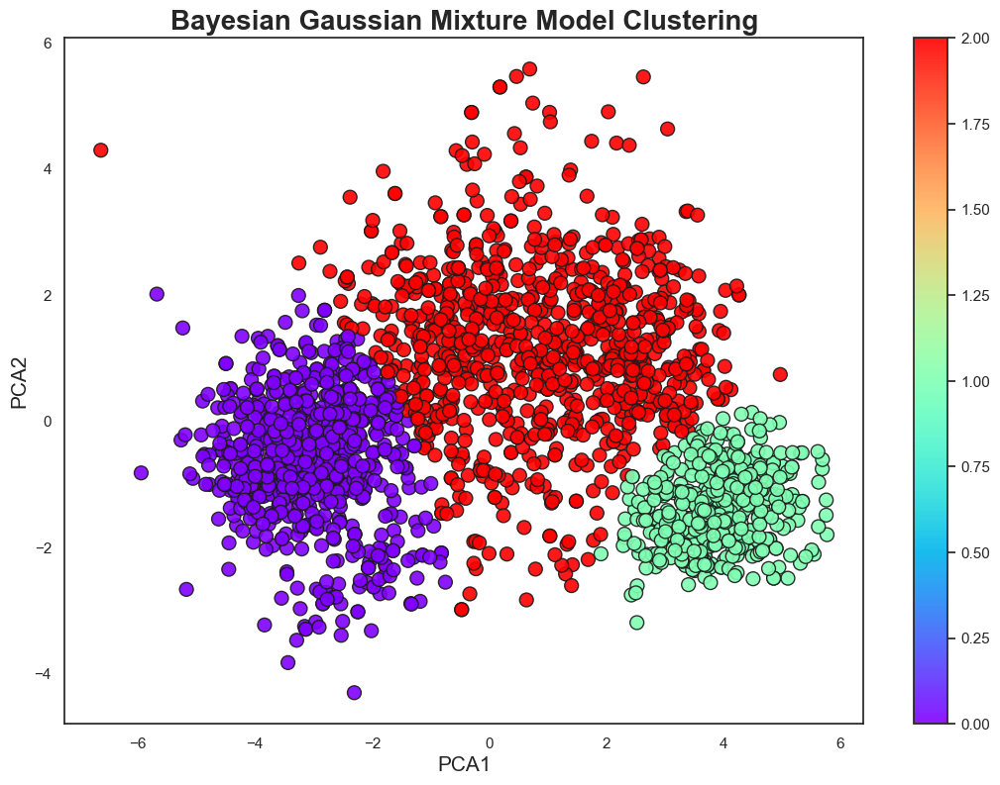

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualizing the clusters
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('Bayesian Gaussian Mixture Model Clustering', weight='bold', size=20)
plt.xlabel('PCA1', fontsize=15)
plt.ylabel('PCA2', fontsize=15)
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'], c=bgmm_labels, s=100, cmap='rainbow', edgecolor='k', alpha=0.9
)
plt.colorbar(scatter)
plt.show()

In [38]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score

# Calculate Davies-Bouldin Index
db_index = davies_bouldin_score(reduced, bgmm_labels)
print("Davies-Bouldin Index:", db_index)

# Calculate Calinski-Harabasz Index
ch_index = calinski_harabasz_score(reduced, bgmm_labels)
print("Calinski-Harabasz Index:", ch_index)

# Calculate Silhouette Score
sil_score = silhouette_score(reduced, bgmm_labels)
print("Silhouette Score:", sil_score)

Davies-Bouldin Index: 0.6909854102190454
Calinski-Harabasz Index: 3435.1891359574724
Silhouette Score: 0.47414719019658275


### DBSCAN Clustering
* Density-based spatial clustering of applications with noise (DBSCAN) is a data clustering algorithm.
* DBSCAN algorithm group points based on distance measurement, usually the Euclidean distance and the minimum number of points. An essential property of this algorithm is that it helps us track down the outliers as the points in low-density regions; hence it is not sensitive to outliers as is the case of K-Means clustering.

**Minimum Points minPts**

In DBSCAN minPts is the minimum number of data points that should be there in the region to define the cluster. You can choose the value of minPts based on your domain knowledge. But if you lack domain knowledge a good reference point is to have minPts ≥ D + 1 where D is the dimension of the dataset.

It is recommended to keep the value for the minPts at least 3, but for larger data sets, a greater minPts value should be chosen, especially if it has many outliers.

### Finding the Optimal value of Epsilon

Rather than experimenting with different values of epsilon, we can use the elbow point detection method to arrive at a suitable value of epsilon.

In this approach, the average distance between each point and its k nearest neighbors is calculated where k = the MinPts selected.

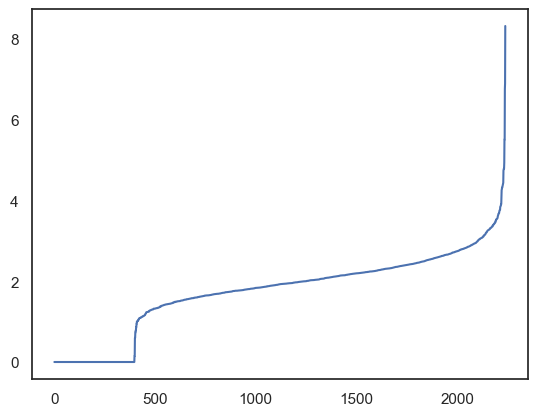

In [39]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

neighbors = NearestNeighbors(n_neighbors=17)
neighbors_fit = neighbors.fit(df_scaled)
distances, indices = neighbors_fit.kneighbors(df_scaled)

distances = np.sort(distances, axis=0)

distances = distances[:,1]
plt.plot(distances)
plt.show()

### **Kneedle algorithm**
* We’ll use the Kneedle algorithm here via Kevin Arvai’s excellent Python implementation called Kneed. You can download this via PyPi by entering `pip3 install kneed` into your terminal and then importing the package with `from kneed import KneeLocator`.

<Figure size 500x500 with 0 Axes>

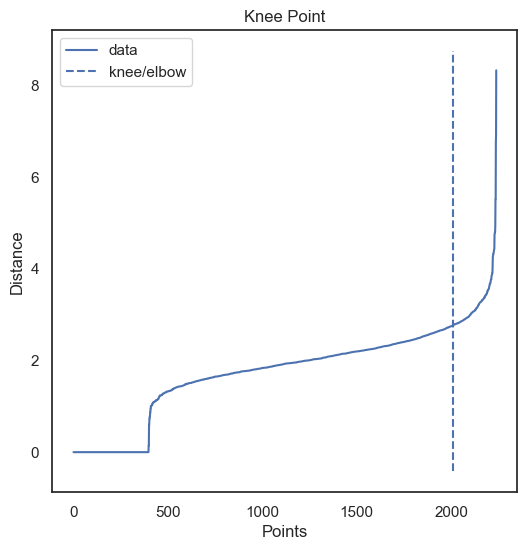

Knee Locator k = 2.7566368787163147


In [40]:
!pip install kneed
from kneed import KneeLocator

i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')

fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")
plt.show()
k= distances[knee.knee]
print('Knee Locator k =', k)

### For 2-dimensional data, use DBSCAN’s default value of MinPts = 4 (Ester et al., 1996).

**DBSCAN algorithm works with two parameters.**

These parameters are:

* Epsilon (Eps): This is the least distance required for two points to be termed as a neighbor. This distance is known as Epsilon (Eps). Thus we consider Eps as a threshold for considering two points as neighbors, i.e., if the distance between two points is utmost Eps, then we consider the two points to be neighbors.

* MinPoints: This refers to the minimum number of points needed to construct a cluster. We consider MinPoints as a threshold for considering a cluster as a cluster. A cluster is only recognized if the number of points is greater than or equal to the MinPts.


### Plot using PCA

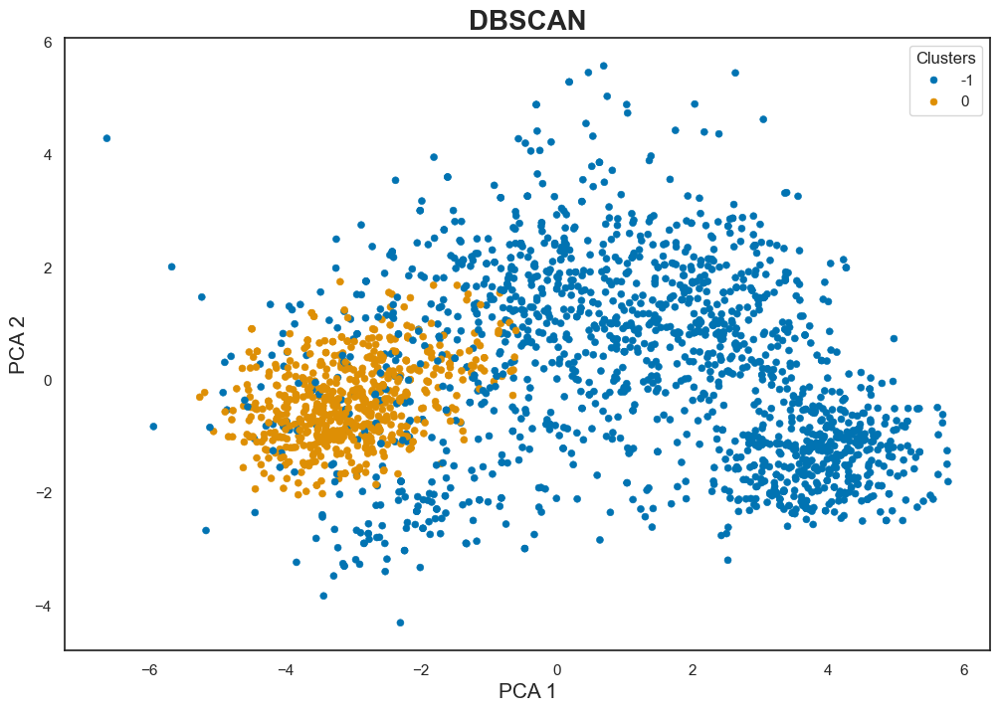

In [41]:
# Fit the DBSCAN model
model = DBSCAN(eps=k, min_samples=100).fit(df_scaled)
model_label = model.labels_

# Plotting the results
plt.figure(figsize=(12, 8))

plt.title('DBSCAN', weight='bold', size=20)
plt.xlabel('PCA 1', size=15)
plt.ylabel('PCA 2', size=15)

# Use seaborn's scatterplot without the 'cmap' argument
scatter = sns.scatterplot(
    x=reduced[:, 0], y=reduced[:, 1], hue=model_label,
    palette=sns.color_palette("colorblind", len(set(model_label))), 
    s=25, edgecolor=None
)

plt.legend(title='Clusters', loc='best')
plt.show()

In [42]:
# Metrics evaluation
try:
    # Davies-Bouldin Index
    db_index = davies_bouldin_score(df_scaled, model_label)
    print("Davies-Bouldin Index:", db_index)

    # Calinski-Harabasz Index
    ch_index = calinski_harabasz_score(df_scaled, model_label)
    print("Calinski-Harabasz Index:", ch_index)

    # Silhouette Score (only if more than one cluster is found)
    if len(set(model_label)) > 1:
        sil_score = silhouette_score(df_scaled, model_label)
        print("Silhouette Score:", sil_score)
    else:
        print("Silhouette Score cannot be computed as only one cluster is detected.")
except ValueError as e:
    print(f"Error in metric calculation: {e}")

Davies-Bouldin Index: 1.6464073823451575
Calinski-Harabasz Index: 516.0949331771394
Silhouette Score: 0.1542520020666019


### HDBSCAN (Hierarchical DBSCAN)

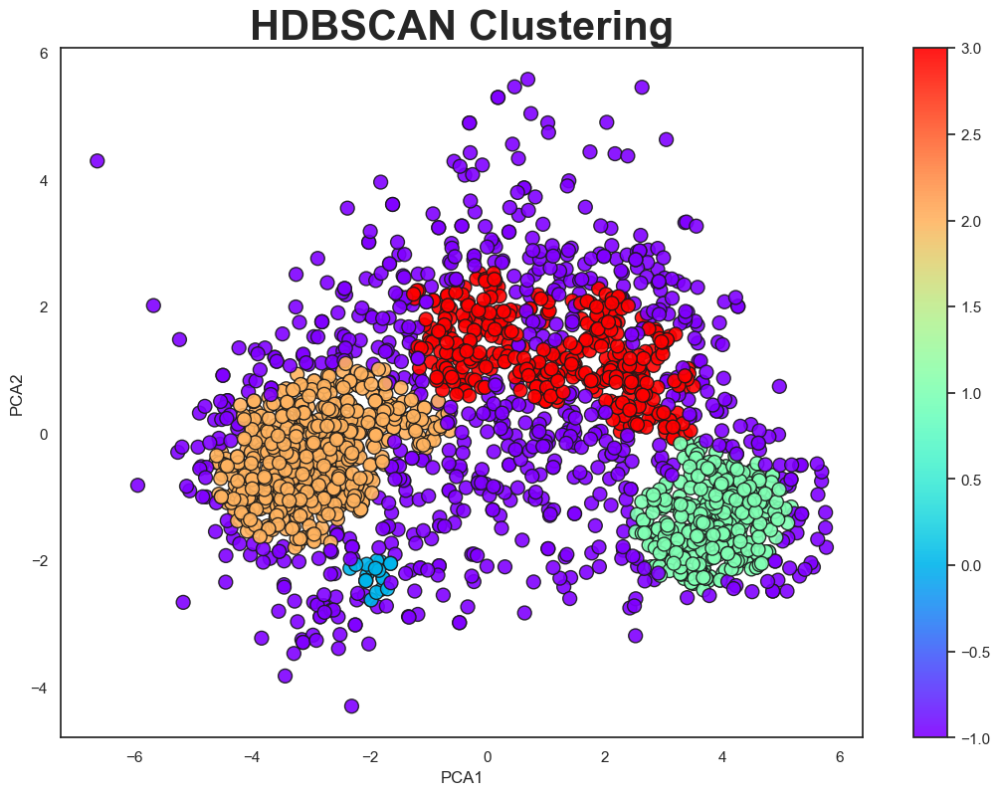

In [43]:
import hdbscan

# Applying HDBSCAN to the reduced PCA data
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, gen_min_span_tree=True)
hdbscan_labels = hdbscan_model.fit_predict(reduced)
# Plotting the HDBSCAN clusters
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('HDBSCAN Clustering', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'], 
    c=hdbscan_labels, s=100, cmap='rainbow', edgecolor='k', alpha=0.9
)
plt.colorbar(scatter)
plt.show()

In [44]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score

# Check the number of clusters (excluding noise labeled as -1)
n_clusters = len(set(hdbscan_labels)) - (1 if -1 in hdbscan_labels else 0)

if n_clusters > 1:
    # Filter out noise points for valid calculations
    valid_points = reduced[hdbscan_labels != -1]
    valid_labels = hdbscan_labels[hdbscan_labels != -1]

    # Davies-Bouldin Index
    db_index = davies_bouldin_score(valid_points, valid_labels)
    print("Davies-Bouldin Index:", db_index)

    # Calinski-Harabasz Index
    ch_index = calinski_harabasz_score(valid_points, valid_labels)
    print("Calinski-Harabasz Index:", ch_index)

    # Silhouette Score
    sil_score = silhouette_score(valid_points, valid_labels)
    print("Silhouette Score:", sil_score)
else:
    print("Cannot compute Calinski-Harabasz Index or Silhouette Score: less than 2 clusters.")


Davies-Bouldin Index: 0.5489688478078927
Calinski-Harabasz Index: 3631.482131216555
Silhouette Score: 0.49775190574798683


### Spectral Clustering 

Silhouette Score: 0.20568146561911885


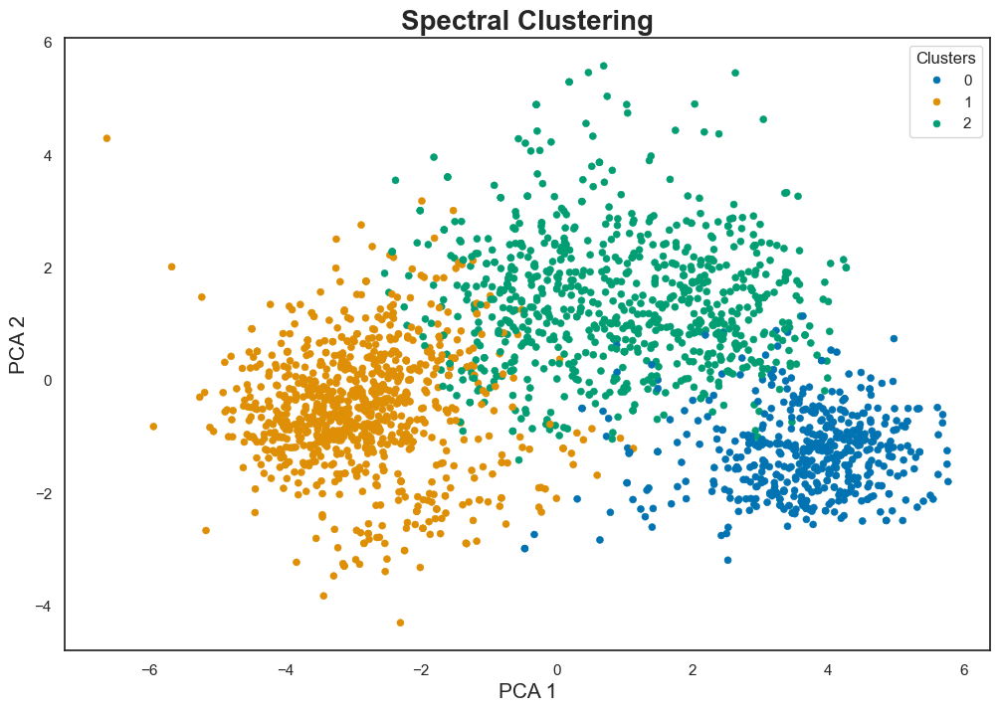

In [45]:
from sklearn.cluster import SpectralClustering
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your data is already scaled and stored in df_scaled
pca = PCA(n_components=2)
reduced = pca.fit_transform(df_scaled)

# Apply Spectral Clustering
n_clusters = 3
model = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
model_label = model.fit_predict(df_scaled)
silhouette_avg = silhouette_score(df_scaled, model_label)
print(f'Silhouette Score: {silhouette_avg}')
# Plotting the results
plt.figure(figsize=(12, 8))
plt.title('Spectral Clustering', weight='bold', size=20)
plt.xlabel('PCA 1', size=15)
plt.ylabel('PCA 2', size=15)

# Use seaborn's scatterplot to visualize the clusters
scatter = sns.scatterplot(
    x=reduced[:, 0], y=reduced[:, 1], hue=model_label,
    palette=sns.color_palette("colorblind", len(set(model_label))),
    s=25, edgecolor=None
)

plt.legend(title='Clusters', loc='best')
plt.show()

In [46]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score

# Check the number of clusters
n_clusters = len(set(model_label))

if n_clusters > 1:
    # Davies-Bouldin Index
    db_index = davies_bouldin_score(df_scaled, model_label)
    print(f"Davies-Bouldin Index: {db_index}")

    # Calinski-Harabasz Index
    ch_index = calinski_harabasz_score(df_scaled, model_label)
    print(f"Calinski-Harabasz Index: {ch_index}")

    # Silhouette Score (already computed in your code)
    print(f"Silhouette Score: {silhouette_avg}")
else:
    print("Cannot compute Davies-Bouldin Index, Calinski-Harabasz Index, or Silhouette Score: less than 2 clusters.")

Davies-Bouldin Index: 1.779129977523013
Calinski-Harabasz Index: 705.5737981307938
Silhouette Score: 0.20568146561911885


### Fuzzy C -Means Algorithm

In [47]:
!pip install scikit-fuzzy

Silhouette Score: 0.509
Davies-Bouldin Index: 0.704
Calinski-Harabasz Index: 4035.563


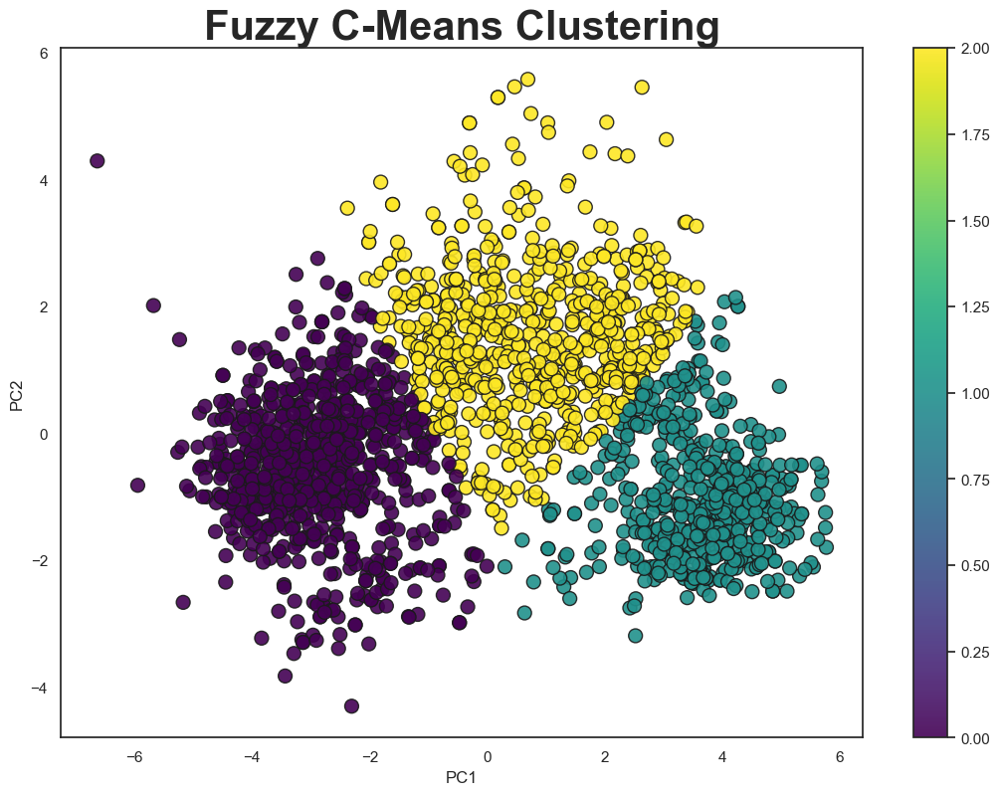

In [48]:
# Importing necessary modules
import skfuzzy as fuzz
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# Performing PCA for dimensionality reduction
pca_final = PCA(n_components=2, random_state=42).fit(df_scaled)
reduced = pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

# Applying Fuzzy C-Means clustering
n_clusters = 3
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    reduced.T, n_clusters, 2, error=0.005, maxiter=1000, init=None
)

# Assigning clusters based on highest membership value
cluster_labels = np.argmax(u, axis=0)

# Calculating silhouette score for Fuzzy C-Means
silhouette_avg = silhouette_score(reduced, cluster_labels)
print(f"Silhouette Score: {silhouette_avg:.3f}")

# Calculating Davies-Bouldin Index
dbi = davies_bouldin_score(reduced, cluster_labels)
print(f"Davies-Bouldin Index: {dbi:.3f}")

# Calculating Calinski-Harabasz Index
chi = calinski_harabasz_score(reduced, cluster_labels)
print(f"Calinski-Harabasz Index: {chi:.3f}")


# Plotting the Fuzzy C-Means clusters
plt.figure(figsize=(13, 9))
plt.title('Fuzzy C-Means Clustering', weight='bold', size=30)
plt.xlabel('PC1')
plt.ylabel('PC2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=cluster_labels, s=100, cmap='viridis', edgecolor='k', alpha=0.9)
plt.colorbar(scatter)
plt.show()

### BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies)

The average Silhouette Score for BIRCH is: 0.414
The Davies-Bouldin Index for BIRCH is: 0.814
The Calinski-Harabasz Index for BIRCH is: 2725.274


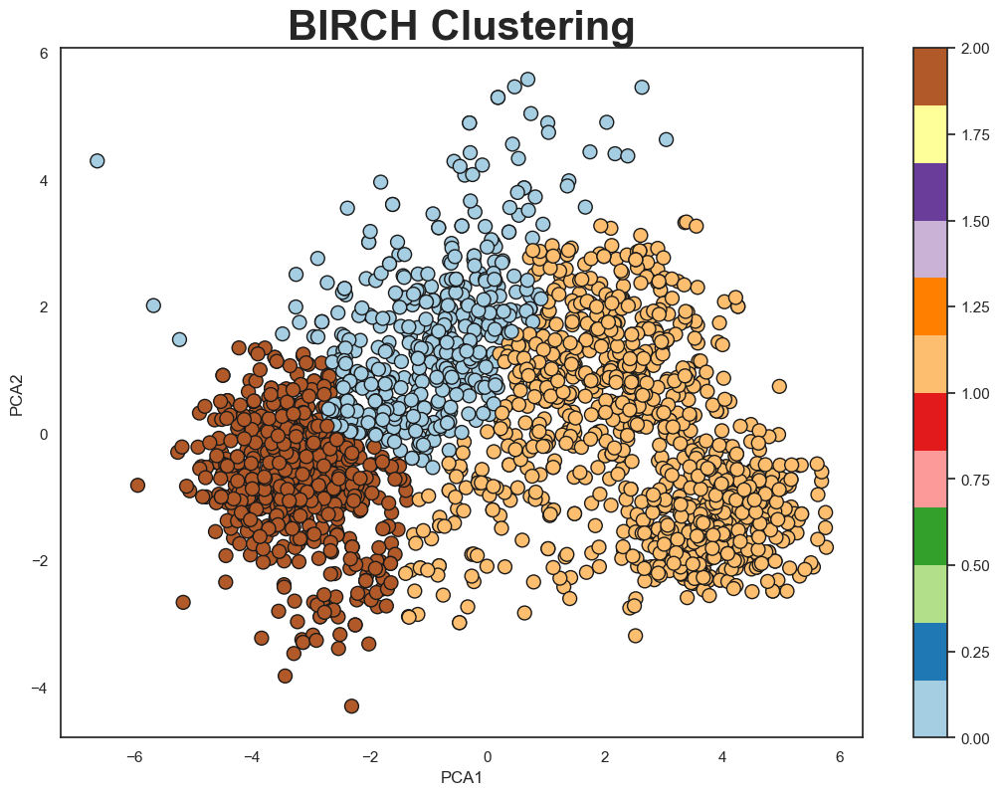

In [49]:
# Import necessary libraries
from sklearn.cluster import Birch
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Apply PCA to reduce dimensions for visualization
pca_final = PCA(n_components=2, random_state=42).fit(df_scaled)
reduced = pca_final.transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

# Initialize the BIRCH model
birch_model = Birch(n_clusters=3)

# Fit the BIRCH model
birch_model.fit(reduced)

# Predict the clusters
birch_labels = birch_model.predict(reduced)

# Calculate the silhouette score
birch_silhouette_avg = silhouette_score(reduced, birch_labels)
print(f"The average Silhouette Score for BIRCH is: {birch_silhouette_avg:.3f}")

# Calculate the Davies-Bouldin Index
birch_dbi = davies_bouldin_score(reduced, birch_labels)
print(f"The Davies-Bouldin Index for BIRCH is: {birch_dbi:.3f}")

# Calculate the Calinski-Harabasz Index
birch_chi = calinski_harabasz_score(reduced, birch_labels)
print(f"The Calinski-Harabasz Index for BIRCH is: {birch_chi:.3f}")

# Plot the BIRCH clustering result
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('BIRCH Clustering', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'],
    c=birch_labels, s=100, cmap='Paired', edgecolor='k'
)
plt.colorbar(scatter)
plt.show()


### OPTICS (Ordering Points To Identify the Clustering Structure)

In [50]:
# Import necessary libraries
from sklearn.cluster import OPTICS
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Apply PCA to reduce dimensions for visualization
pca_final = PCA(n_components=2, random_state=42).fit(df_scaled)
reduced = pca_final.transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

# Apply OPTICS to the reduced PCA data
optics_model = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.1).fit(reduced)
optics_labels = optics_model.labels_

In [51]:
# Calculate the silhouette score for the OPTICS clusters
silhouette_avg_optics = silhouette_score(reduced, optics_labels)
print(f"The average Silhouette Score for OPTICS is: {silhouette_avg_optics:.3f}")

# Calculate the Davies-Bouldin Index for OPTICS
optics_dbi = davies_bouldin_score(reduced, optics_labels)
print(f"The Davies-Bouldin Index for OPTICS is: {optics_dbi:.3f}")

# Calculate the Calinski-Harabasz Index for OPTICS
optics_chi = calinski_harabasz_score(reduced, optics_labels)
print(f"The Calinski-Harabasz Index for OPTICS is: {optics_chi:.3f}")

The average Silhouette Score for OPTICS is: 0.225
The Davies-Bouldin Index for OPTICS is: 3.499
The Calinski-Harabasz Index for OPTICS is: 18.232


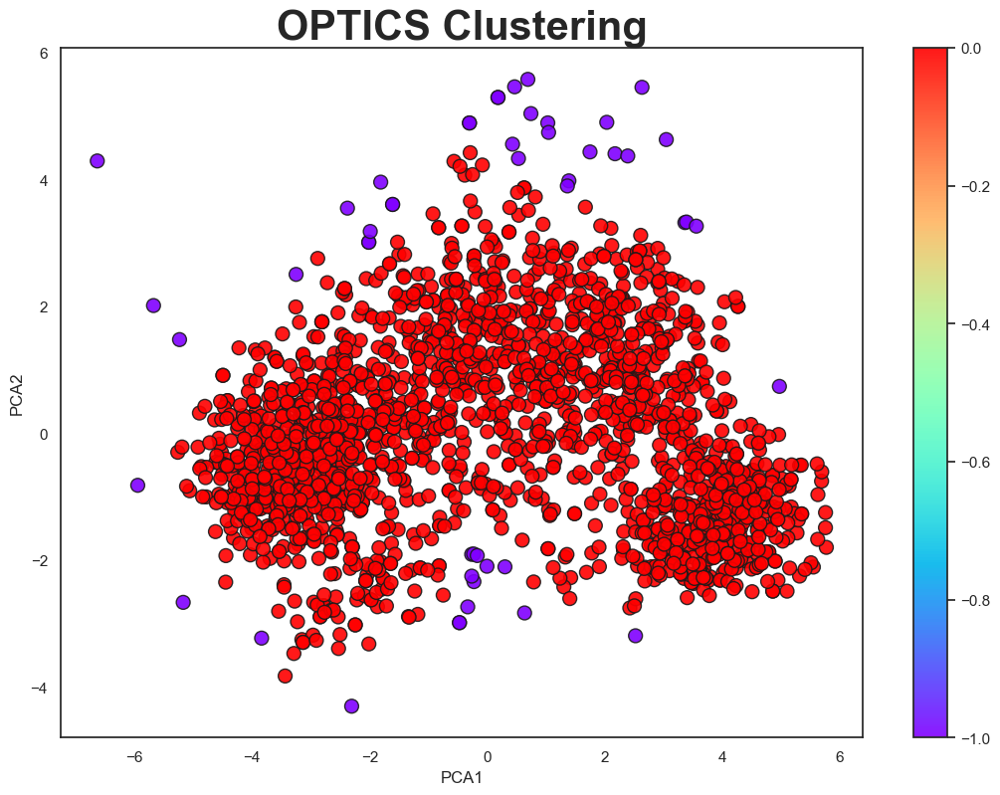

In [52]:
# Visualize the OPTICS clustering results
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('OPTICS Clustering', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'],
    c=optics_labels, s=100, cmap='rainbow', edgecolor='k', alpha=0.9
)
plt.colorbar(scatter)
plt.show()

### Affinity Propagation

The average Silhouette Score for Affinity Propagation is: 0.32798108697335426
The Davies-Bouldin Index for Affinity Propagation is: 0.875
The Calinski-Harabasz Index for Affinity Propagation is: 2818.410


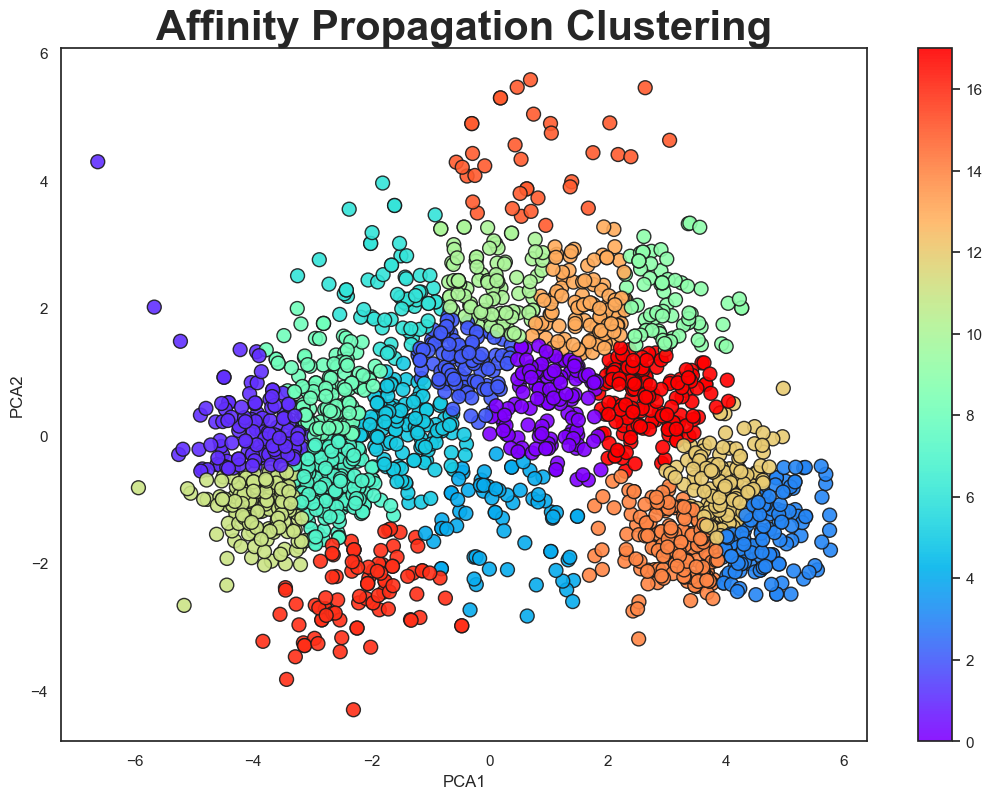

In [53]:
# Import necessary libraries
from sklearn.cluster import AffinityPropagation
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from matplotlib import cm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Function to apply Affinity Propagation and plot results
def affinity_propagation_clustering(X, preference=-50, damping=0.9):
    # Apply Affinity Propagation
    model = AffinityPropagation(preference=preference, damping=damping, random_state=42)
    cluster_labels = model.fit_predict(X)

    # Calculate silhouette score
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(f"The average Silhouette Score for Affinity Propagation is: {silhouette_avg}")
    
    return cluster_labels

# Apply Affinity Propagation on PCA reduced data
ap_cluster_labels = affinity_propagation_clustering(reduced)

# Calculate the Davies-Bouldin Index for Affinity Propagation
ap_dbi = davies_bouldin_score(reduced, ap_cluster_labels)
print(f"The Davies-Bouldin Index for Affinity Propagation is: {ap_dbi:.3f}")

# Calculate the Calinski-Harabasz Index for Affinity Propagation
ap_chi = calinski_harabasz_score(reduced, ap_cluster_labels)
print(f"The Calinski-Harabasz Index for Affinity Propagation is: {ap_chi:.3f}")

# Plotting the clusters for Affinity Propagation
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('Affinity Propagation Clustering', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'],
    c=ap_cluster_labels, s=100, cmap='rainbow', edgecolor='k', alpha=0.9
)
plt.colorbar(scatter)
plt.show()


### Mean Shift Clustering

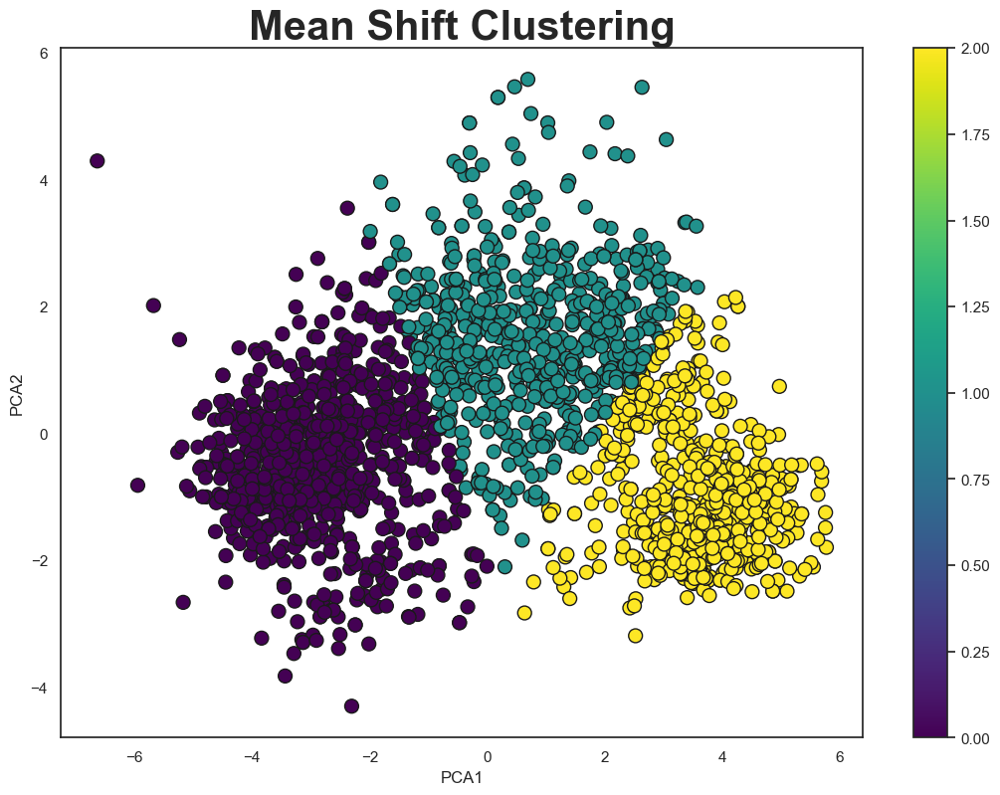

Silhouette Score for Mean Shift Clustering:  0.5030067354069647
Davies-Bouldin Index for Mean Shift Clustering: 0.717
Calinski-Harabasz Index for Mean Shift Clustering: 3993.870


In [54]:
# Import necessary libraries
from sklearn.cluster import MeanShift
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Fit the model to reduced data
model = MeanShift().fit(reduced)
model_label = model.labels_

# Plotting the clusters for Mean Shift
plt.figure(figsize=(13,9))
plt.title('Mean Shift Clustering', weight='bold', size=30)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=model_label, s=100, cmap='viridis', edgecolor='k')
plt.colorbar(scatter)
plt.show()

# Calculate the silhouette score for the clustering result
sil_score = silhouette_score(reduced, model_label)
print("Silhouette Score for Mean Shift Clustering: ", sil_score)

# Calculate the Davies-Bouldin Index for Mean Shift
dbi = davies_bouldin_score(reduced, model_label)
print(f"Davies-Bouldin Index for Mean Shift Clustering: {dbi:.3f}")

# Calculate the Calinski-Harabasz Index for Mean Shift
chi = calinski_harabasz_score(reduced, model_label)
print(f"Calinski-Harabasz Index for Mean Shift Clustering: {chi:.3f}")


### SpectralClustering

Spectral Clustering with n_clusters=2 has Silhouette Score: 0.527669182761869
Davies-Bouldin Index for Spectral Clustering with n_clusters=2: 0.709
Calinski-Harabasz Index for Spectral Clustering with n_clusters=2: 3584.295


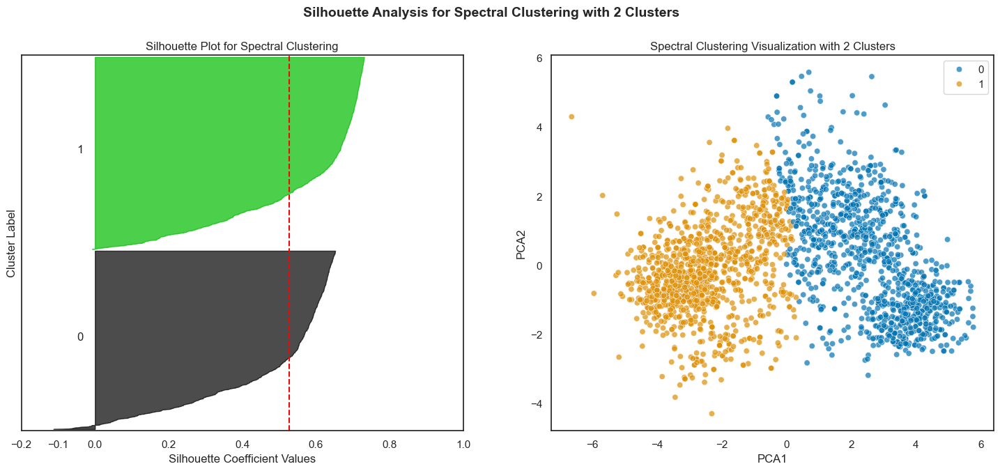

Spectral Clustering with n_clusters=3 has Silhouette Score: 0.4961469502032664
Davies-Bouldin Index for Spectral Clustering with n_clusters=3: 0.685
Calinski-Harabasz Index for Spectral Clustering with n_clusters=3: 3787.686


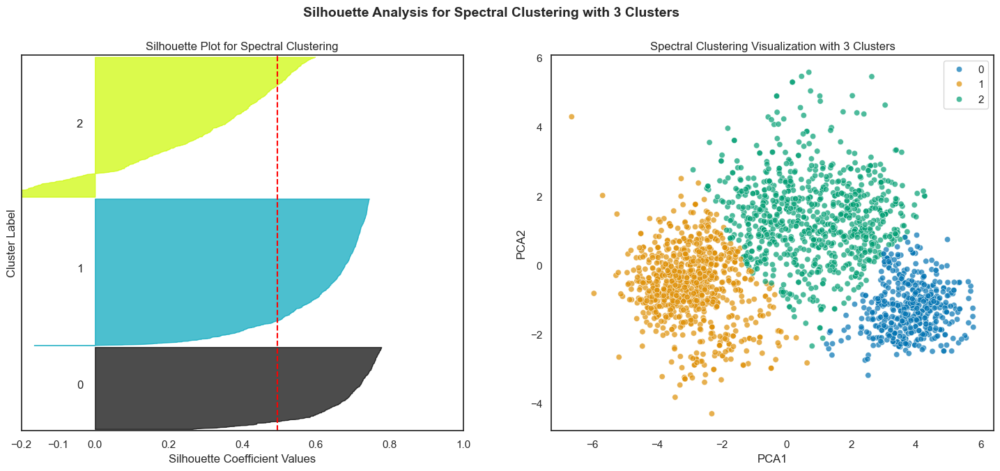

Spectral Clustering with n_clusters=4 has Silhouette Score: 0.40498270597274766
Davies-Bouldin Index for Spectral Clustering with n_clusters=4: 0.856
Calinski-Harabasz Index for Spectral Clustering with n_clusters=4: 3359.219


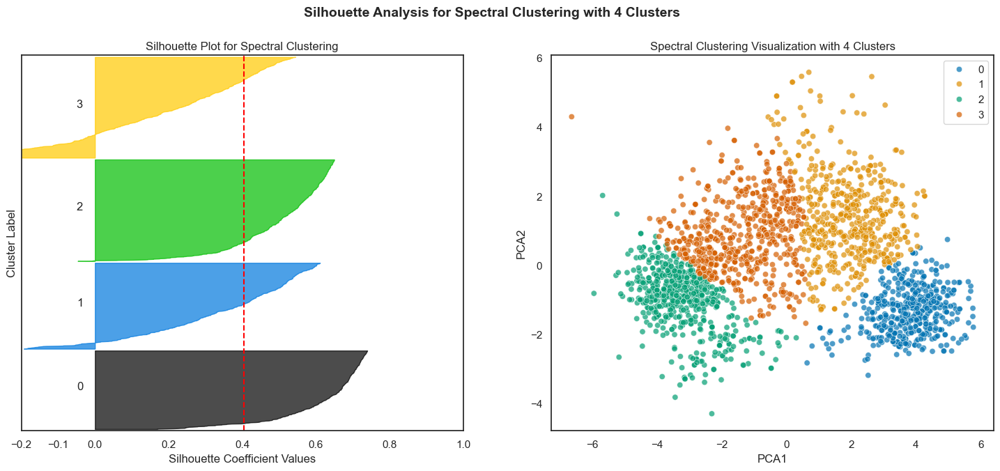

Spectral Clustering with n_clusters=5 has Silhouette Score: 0.3774656507714813
Davies-Bouldin Index for Spectral Clustering with n_clusters=5: 0.945
Calinski-Harabasz Index for Spectral Clustering with n_clusters=5: 2737.693


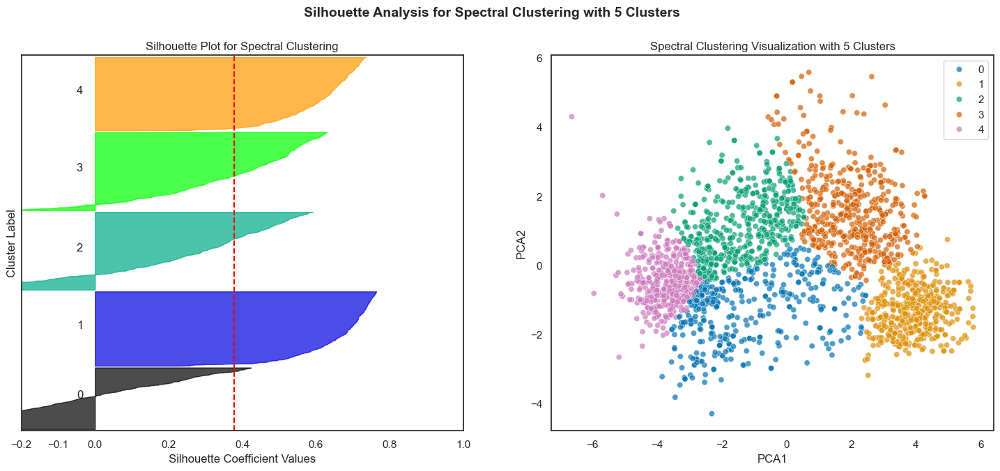

Spectral Clustering with n_clusters=6 has Silhouette Score: 0.3579577412869043
Davies-Bouldin Index for Spectral Clustering with n_clusters=6: 0.888
Calinski-Harabasz Index for Spectral Clustering with n_clusters=6: 2925.651


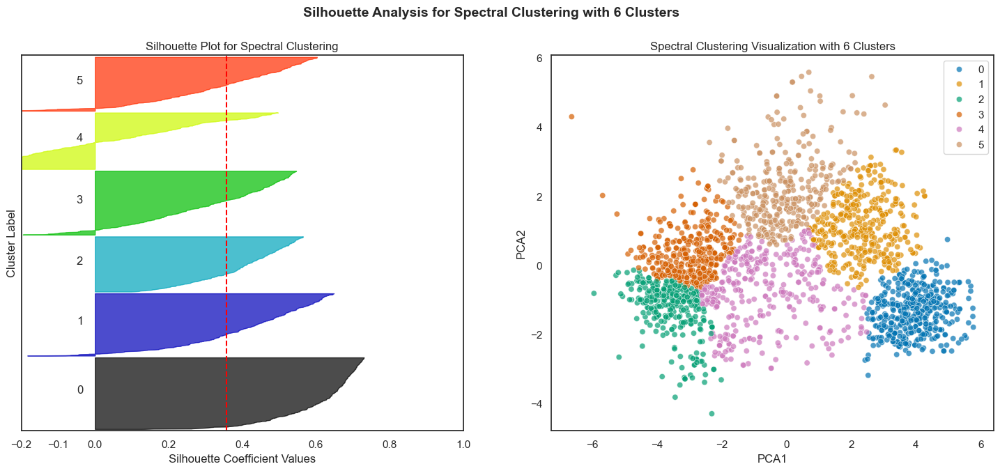

Spectral Clustering with n_clusters=7 has Silhouette Score: 0.3241991034976998
Davies-Bouldin Index for Spectral Clustering with n_clusters=7: 0.957
Calinski-Harabasz Index for Spectral Clustering with n_clusters=7: 2670.938


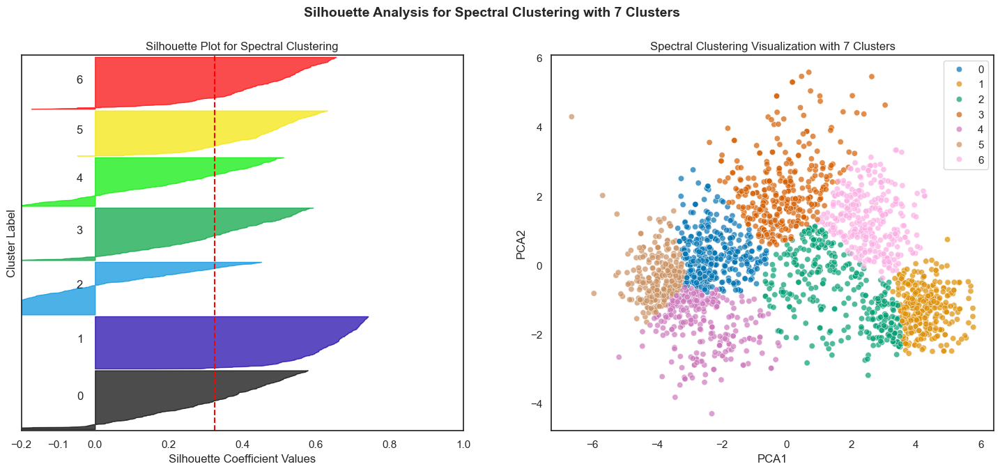

Spectral Clustering with n_clusters=8 has Silhouette Score: 0.26883887179604116
Davies-Bouldin Index for Spectral Clustering with n_clusters=8: 1.043
Calinski-Harabasz Index for Spectral Clustering with n_clusters=8: 2527.216


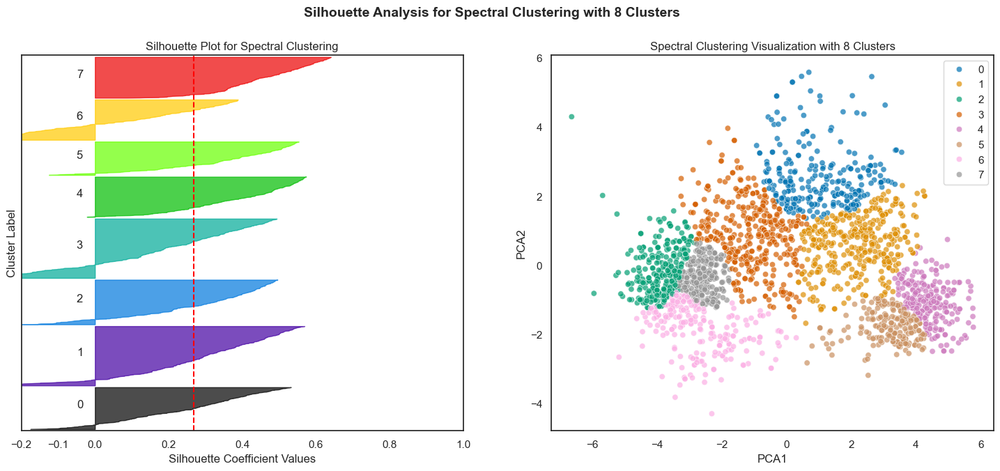

Spectral Clustering with n_clusters=9 has Silhouette Score: 0.28606040128984994
Davies-Bouldin Index for Spectral Clustering with n_clusters=9: 0.961
Calinski-Harabasz Index for Spectral Clustering with n_clusters=9: 2611.716


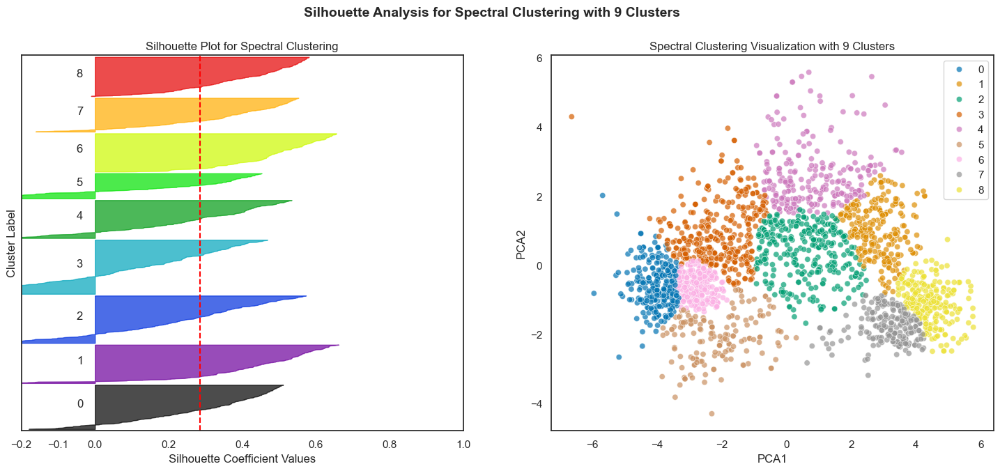

Spectral Clustering with n_clusters=10 has Silhouette Score: 0.3015643168962314
Davies-Bouldin Index for Spectral Clustering with n_clusters=10: 0.937
Calinski-Harabasz Index for Spectral Clustering with n_clusters=10: 2612.776


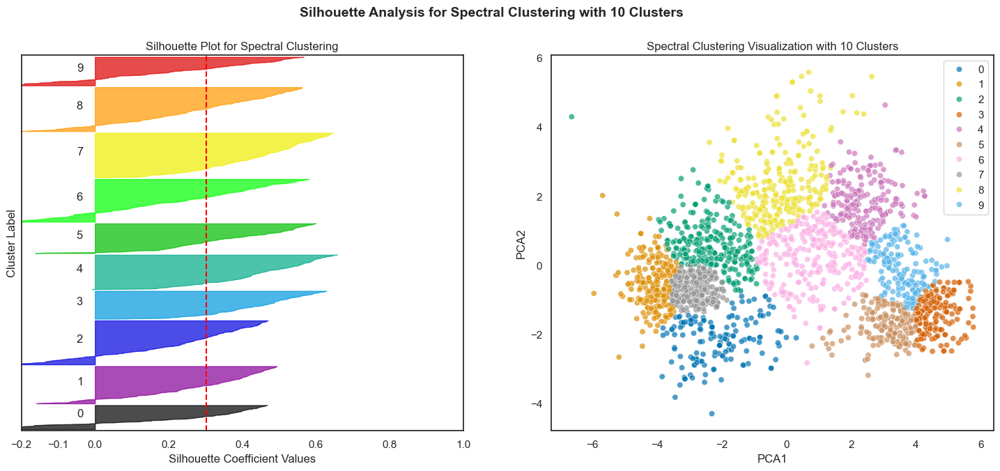

Spectral Clustering with n_clusters=11 has Silhouette Score: 0.29387839775123203
Davies-Bouldin Index for Spectral Clustering with n_clusters=11: 0.882
Calinski-Harabasz Index for Spectral Clustering with n_clusters=11: 2532.488


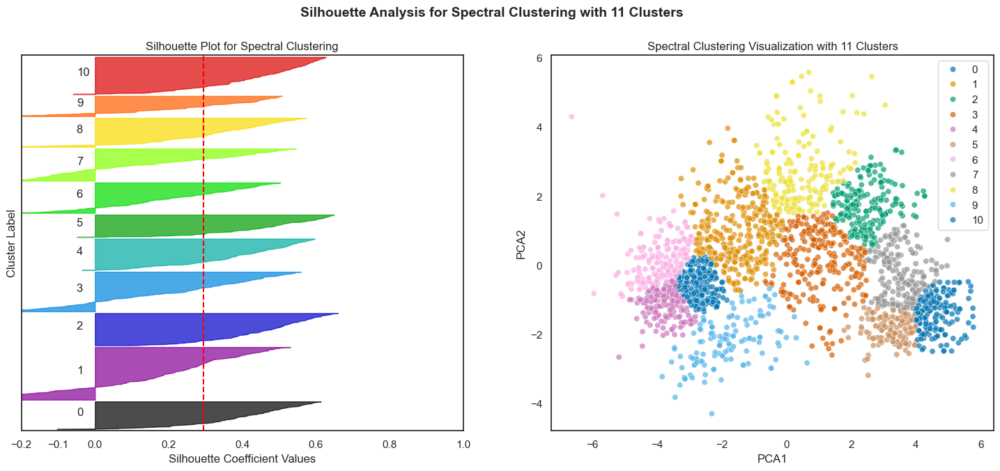

In [55]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, silhouette_samples
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import cm

# Function to apply Spectral Clustering and plot silhouette scores
def spectral_clustering_and_silhouette(X, n_clusters_range, pca):
    for n_clusters in n_clusters_range:
        # Create a Spectral Clustering model
        clusterer = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
        cluster_labels = clusterer.fit_predict(X)
        
        # Calculate Silhouette Score
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(f"Spectral Clustering with n_clusters={n_clusters} has Silhouette Score: {silhouette_avg}")
        
        # Davies-Bouldin Index
        dbi = davies_bouldin_score(X, cluster_labels)
        print(f"Davies-Bouldin Index for Spectral Clustering with n_clusters={n_clusters}: {dbi:.3f}")
        
        # Calinski-Harabasz Index
        chi = calinski_harabasz_score(X, cluster_labels)
        print(f"Calinski-Harabasz Index for Spectral Clustering with n_clusters={n_clusters}: {chi:.3f}")
        
        # Silhouette plot
        sample_silhouette_values = silhouette_samples(X, cluster_labels)
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)
        
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
        
        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10
        
        ax1.set_title("Silhouette Plot for Spectral Clustering")
        ax1.set_xlabel("Silhouette Coefficient Values")
        ax1.set_ylabel("Cluster Label")
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        ax1.set_xticks([-0.2, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        
        # Cluster visualization
        sns.scatterplot(x=pca[:, 0], y=pca[:, 1], hue=cluster_labels, palette=sns.color_palette("colorblind", n_clusters), alpha=0.7, ax=ax2)
        ax2.set_title(f"Spectral Clustering Visualization with {n_clusters} Clusters")
        ax2.set_xlabel("PCA1")
        ax2.set_ylabel("PCA2")
        
        plt.suptitle(f"Silhouette Analysis for Spectral Clustering with {n_clusters} Clusters", fontsize=14, fontweight="bold")
        plt.show()

# Apply Spectral Clustering with Silhouette Score Calculation
spectral_clustering_and_silhouette(reduced, range(2, 12), reduced)


### Recurrent Neural Networks (RNN)

In [56]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from torch.utils.data import DataLoader, TensorDataset
import numpy as np

# Normalize data for RNN
scaler = MinMaxScaler()
rnn_data = scaler.fit_transform(df_scaled)  # Assuming df_scaled is your scaled dataset

# Convert to tensors
rnn_data_tensor = torch.tensor(rnn_data, dtype=torch.float32)

# Define RNN Model
class RNNClustering(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers):
        super(RNNClustering, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, input_size)  # Map hidden_size to input_size

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size)
        out, _ = self.rnn(x, h0)
        out = self.fc(out[:, -1, :])  # Map last hidden state to input_size
        return out

# Model parameters
input_size = rnn_data.shape[1]
hidden_size = 50
num_layers = 1

model = RNNClustering(input_size, hidden_size, num_layers)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Train the model
dataset = TensorDataset(rnn_data_tensor, rnn_data_tensor)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

epochs = 100
for epoch in range(epochs):
    for inputs, _ in dataloader:
        inputs = inputs.unsqueeze(1)  # Add sequence dimension
        outputs = model(inputs)  # Shape: [batch_size, input_size]
        loss = criterion(outputs, inputs.squeeze(1))  # Match [batch_size, input_size]
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}')

# Use the trained model for clustering
with torch.no_grad():
    hidden_representations = model.rnn(rnn_data_tensor.unsqueeze(1))[1][-1]  # Shape: [num_samples, hidden_size]
    hidden_representations = hidden_representations.numpy()

# Apply KMeans clustering
kmeans_rnn = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans_rnn.fit_predict(hidden_representations)

Epoch [10/100], Loss: 0.0003
Epoch [20/100], Loss: 0.0002
Epoch [30/100], Loss: 0.0002
Epoch [40/100], Loss: 0.0006
Epoch [50/100], Loss: 0.0002
Epoch [60/100], Loss: 0.0002
Epoch [70/100], Loss: 0.0002
Epoch [80/100], Loss: 0.0002
Epoch [90/100], Loss: 0.0002
Epoch [100/100], Loss: 0.0001


In [57]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# Compute Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(rnn_data, kmeans_labels)
print(f'Davies-Bouldin Index for RNN-based clustering: {dbi_score:.4f}')

# Compute Calinski-Harabasz Index (CHI)
chi_score = calinski_harabasz_score(rnn_data, kmeans_labels)
print(f'Calinski-Harabasz Index for RNN-based clustering: {chi_score:.4f}')

# Compute Silhouette Score
silhouette_avg = silhouette_score(rnn_data, kmeans_labels)
print(f'Silhouette Score for RNN-based clustering: {silhouette_avg:.4f}')


Davies-Bouldin Index for RNN-based clustering: 1.6987
Calinski-Harabasz Index for RNN-based clustering: 659.2155
Silhouette Score for RNN-based clustering: 0.2145


### Deep Embedded Clustering (DEC)

Epoch [1/20], Loss: 0.7724
Epoch [2/20], Loss: 0.4914
Epoch [3/20], Loss: 0.3665
Epoch [4/20], Loss: 0.3603
Epoch [5/20], Loss: 0.2960
Epoch [6/20], Loss: 0.3458
Epoch [7/20], Loss: 0.1990
Epoch [8/20], Loss: 0.1901
Epoch [9/20], Loss: 0.1760
Epoch [10/20], Loss: 0.1593
Epoch [11/20], Loss: 0.2302
Epoch [12/20], Loss: 0.1476
Epoch [13/20], Loss: 0.2234
Epoch [14/20], Loss: 0.1755
Epoch [15/20], Loss: 0.1163
Epoch [16/20], Loss: 0.2167
Epoch [17/20], Loss: 0.1562
Epoch [18/20], Loss: 0.1132
Epoch [19/20], Loss: 0.1039
Epoch [20/20], Loss: 0.0980


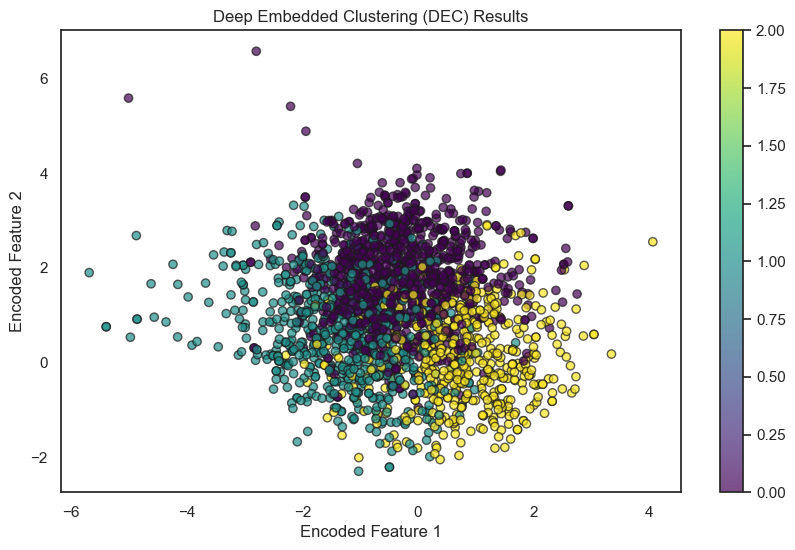

In [58]:
from sklearn.metrics import silhouette_score
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, TensorDataset

# Define an Autoencoder for Deep Embedded Clustering
class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim=10):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 50),
            nn.ReLU(),
            nn.Linear(50, encoding_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 50),
            nn.ReLU(),
            nn.Linear(50, input_dim)
        )
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded

# Convert data to tensor
torch_data = torch.tensor(scaled_data.values, dtype=torch.float32)
dataloader = DataLoader(TensorDataset(torch_data), batch_size=64, shuffle=True)

# Train Autoencoder
input_dim = scaled_data.shape[1]
autoencoder = Autoencoder(input_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)

num_epochs = 20
for epoch in range(num_epochs):
    for batch in dataloader:
        inputs = batch[0]
        optimizer.zero_grad()
        encoded, decoded = autoencoder(inputs)
        loss = criterion(decoded, inputs)
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")

# Extract embeddings for clustering
with torch.no_grad():
    encoded_data, _ = autoencoder(torch_data)
    encoded_data = encoded_data.numpy()

# Apply KMeans to the encoded data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(encoded_data)


# Visualizing DEC Clusters
plt.figure(figsize=(10,6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7, edgecolors='k')
plt.colorbar()
plt.title("Deep Embedded Clustering (DEC) Results")
plt.xlabel("Encoded Feature 1")
plt.ylabel("Encoded Feature 2")
plt.show()

Davies-Bouldin Index for DEC: 1.4262
Calinski-Harabasz Index for DEC: 1189.5074
Silhouette Score for DEC: 0.2810


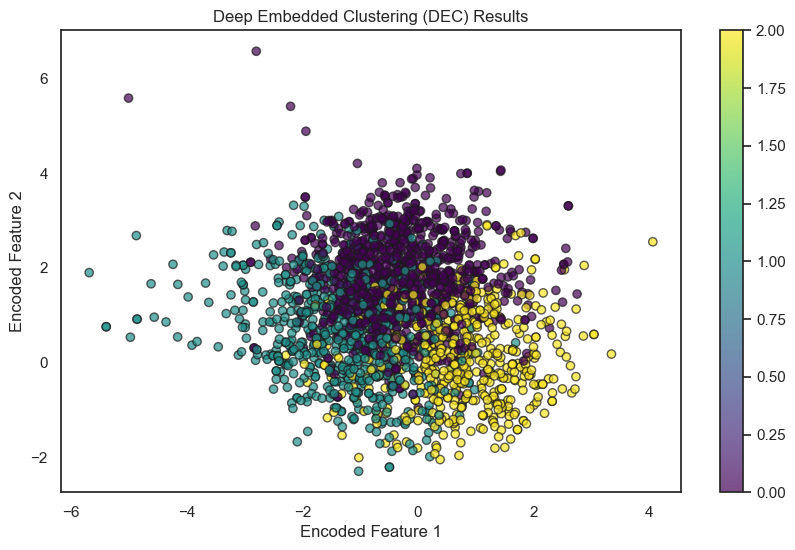

In [59]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

# Calculate Davies-Bouldin Index (DBI)
dbi_score = davies_bouldin_score(encoded_data, kmeans_labels)
print(f'Davies-Bouldin Index for DEC: {dbi_score:.4f}')

# Calculate Calinski-Harabasz Index (CHI)
chi_score = calinski_harabasz_score(encoded_data, kmeans_labels)
print(f'Calinski-Harabasz Index for DEC: {chi_score:.4f}')

# Calculate Silhouette Score
silhouette_avg = silhouette_score(encoded_data, kmeans_labels)
print(f'Silhouette Score for DEC: {silhouette_avg:.4f}')

# Visualize DEC Clusters
plt.figure(figsize=(10,6))
plt.scatter(encoded_data[:, 0], encoded_data[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7, edgecolors='k')
plt.colorbar()
plt.title("Deep Embedded Clustering (DEC) Results")
plt.xlabel("Encoded Feature 1")
plt.ylabel("Encoded Feature 2")
plt.show()


## Model Combinations 

## 1. Hard Voting-Based Ensemble Clustering Approach 

### Using All K-Means, HDBSCAN, Mean Shift, and Fuzzy C-Means

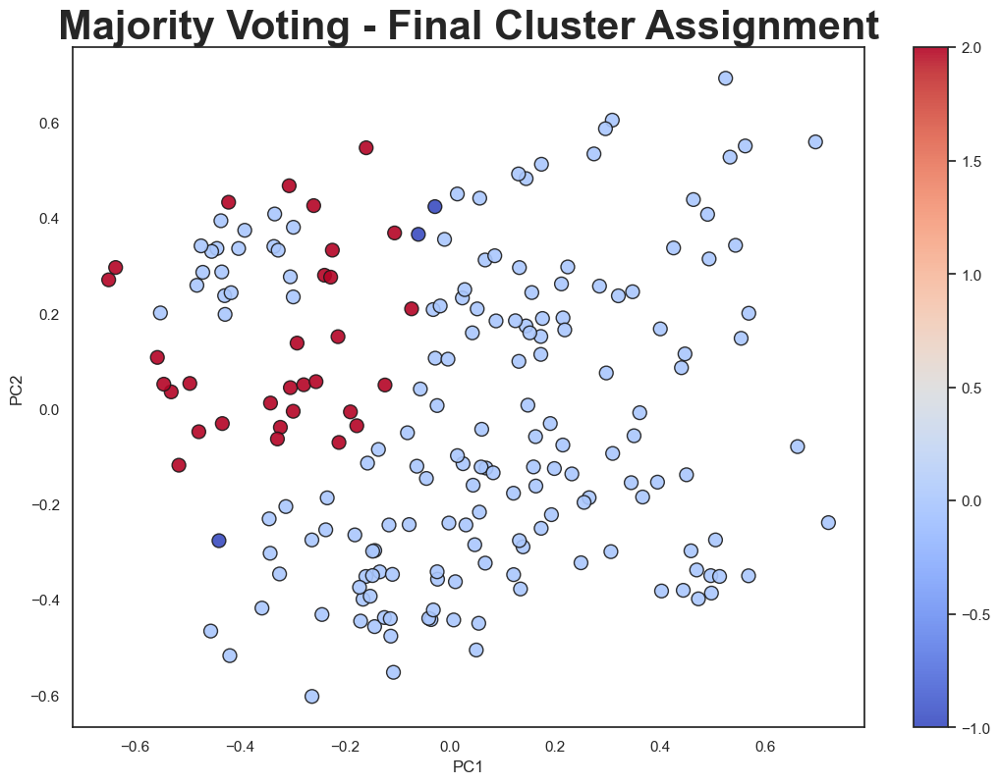

Silhouette Score: 0.054
Davies-Bouldin Index: 3.203
Calinski-Harabasz Index: 14.971


In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, MeanShift
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import hdbscan
import skfuzzy as fuzz
from scipy.stats import mode

# Sample Data Preparation (Assuming df_scaled is preprocessed)
df_scaled = np.random.rand(200, 5)  # Replace with actual scaled data

# PCA for Dimensionality Reduction
pca_final = PCA(n_components=2, random_state=42)
reduced = pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

### K-Means Clustering
kmeans_model = KMeans(n_clusters=3, random_state=42).fit(pcadf)
kmeans_labels = kmeans_model.labels_

### HDBSCAN Clustering
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, gen_min_span_tree=True)
hdbscan_labels = hdbscan_model.fit_predict(pcadf)

### Mean Shift Clustering
mean_shift_model = MeanShift().fit(pcadf)
mean_shift_labels = mean_shift_model.labels_

### Fuzzy C-Means Clustering
n_clusters = 3
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    reduced.T, n_clusters, 2, error=0.005, maxiter=1000, init=None
)
fuzzy_labels = np.argmax(u, axis=0)

# Combine Cluster Labels into a DataFrame
ensemble_df = pd.DataFrame({
    'KMeans': kmeans_labels,
    'HDBSCAN': hdbscan_labels,
    'MeanShift': mean_shift_labels,
    'FuzzyCMeans': fuzzy_labels
})

# Perform Majority Voting
final_labels = mode(ensemble_df, axis=1).mode.flatten()
ensemble_df['FinalCluster'] = final_labels

# Visualization of Final Clusters
plt.figure(figsize=(13, 9))
plt.title('Majority Voting - Final Cluster Assignment', weight='bold', size=30)
plt.xlabel('PC1')
plt.ylabel('PC2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=final_labels, s=100, cmap='coolwarm', edgecolor='k', alpha=0.9)
plt.colorbar(scatter)
plt.show()

# Evaluation Metrics for Final Clusters
silhouette_avg = silhouette_score(pcadf, final_labels)
dbi = davies_bouldin_score(pcadf, final_labels)
chi = calinski_harabasz_score(pcadf, final_labels)

print(f"Silhouette Score: {silhouette_avg:.3f}")
print(f"Davies-Bouldin Index: {dbi:.3f}")
print(f"Calinski-Harabasz Index: {chi:.3f}")

## 2. Hard Voting-Based Ensemble Clustering Approach 

### Using All K-Means, HDBSCAN, and Fuzzy C-Means

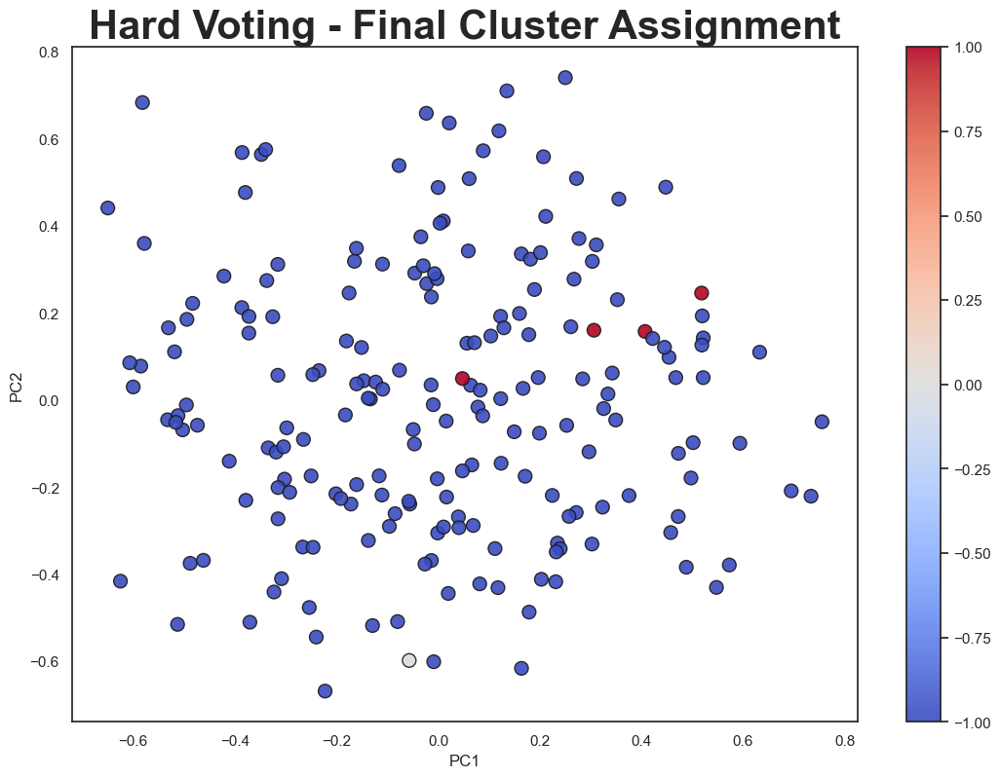

Silhouette Score: -0.211
Davies-Bouldin Index: 1.250
Calinski-Harabasz Index: 2.268


In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import hdbscan
import skfuzzy as fuzz
from scipy.stats import mode

# Simulated dataset (Replace with real scaled data)
df_scaled = np.random.rand(200, 5)  # 200 samples, 5 features

# PCA for Dimensionality Reduction
pca_final = PCA(n_components=2, random_state=42)
reduced = pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

### K-Means Clustering
kmeans_model = KMeans(n_clusters=3, random_state=42).fit(pcadf)
kmeans_labels = kmeans_model.labels_

### HDBSCAN Clustering
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, gen_min_span_tree=True)
hdbscan_labels = hdbscan_model.fit_predict(pcadf)

### Fuzzy C-Means Clustering
n_clusters = 3
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    reduced.T, n_clusters, 2, error=0.005, maxiter=1000, init=None
)
fuzzy_labels = np.argmax(u, axis=0)

# Combine Cluster Labels into a DataFrame
ensemble_df = pd.DataFrame({
    'KMeans': kmeans_labels,
    'HDBSCAN': hdbscan_labels,
    'FuzzyCMeans': fuzzy_labels
})

# Hard Voting: Assign the most common label among the three clustering methods
final_labels = mode(ensemble_df, axis=1).mode.flatten()
ensemble_df['FinalCluster'] = final_labels

# Visualization of Final Clusters
plt.figure(figsize=(13, 9))
plt.title('Hard Voting - Final Cluster Assignment', weight='bold', size=30)
plt.xlabel('PC1')
plt.ylabel('PC2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=final_labels, s=100, cmap='coolwarm', edgecolor='k', alpha=0.9)
plt.colorbar(scatter)
plt.show()

# Evaluation Metrics for Final Clusters
silhouette_avg = silhouette_score(pcadf, final_labels)
dbi = davies_bouldin_score(pcadf, final_labels)
chi = calinski_harabasz_score(pcadf, final_labels)

print(f"Silhouette Score: {silhouette_avg:.3f}")
print(f"Davies-Bouldin Index: {dbi:.3f}")
print(f"Calinski-Harabasz Index: {chi:.3f}")

## 3. Hard Voting-Based Ensemble Clustering Approach 

### Using All K-Means, HDBSCAN, Mean Shift

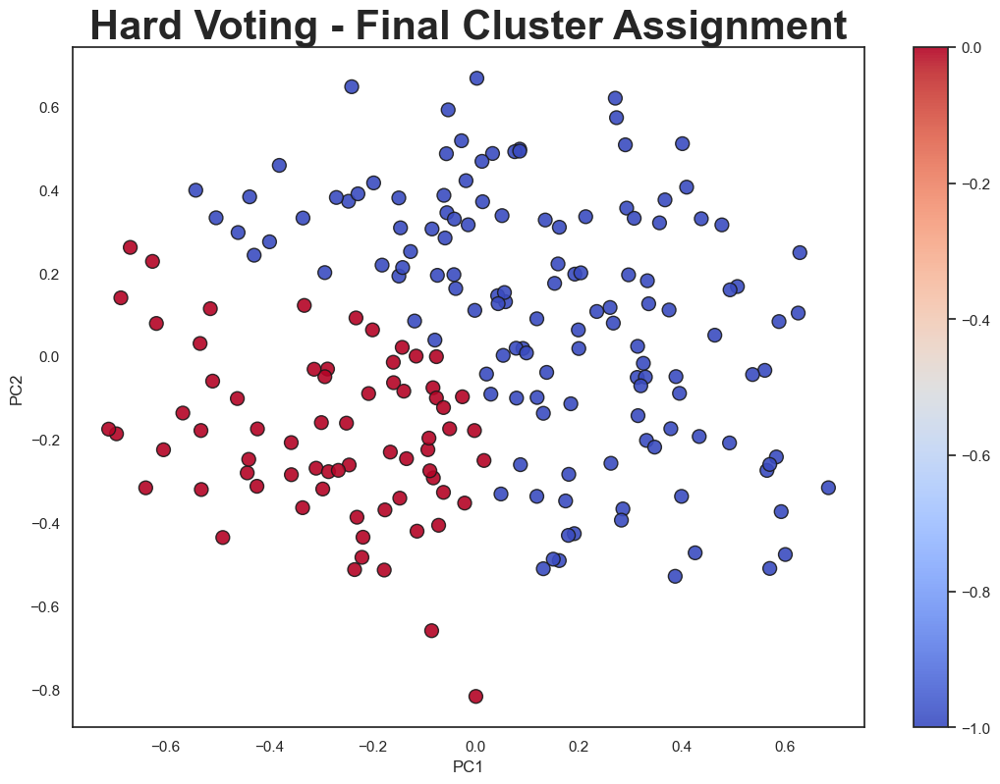

Silhouette Score: 0.306
Davies-Bouldin Index: 1.172
Calinski-Harabasz Index: 92.311


In [62]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, MeanShift
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import hdbscan
from scipy.stats import mode

# Simulated dataset (Replace with real scaled data)
df_scaled = np.random.rand(200, 5)  # 200 samples, 5 features

# PCA for Dimensionality Reduction
pca_final = PCA(n_components=2, random_state=42)
reduced = pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

### K-Means Clustering
kmeans_model = KMeans(n_clusters=3, random_state=42).fit(pcadf)
kmeans_labels = kmeans_model.labels_

### HDBSCAN Clustering
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, gen_min_span_tree=True)
hdbscan_labels = hdbscan_model.fit_predict(pcadf)

### Mean Shift Clustering
mean_shift_model = MeanShift().fit(pcadf)
mean_shift_labels = mean_shift_model.labels_

# Combine Cluster Labels into a DataFrame
ensemble_df = pd.DataFrame({
    'KMeans': kmeans_labels,
    'HDBSCAN': hdbscan_labels,
    'MeanShift': mean_shift_labels
})

# Hard Voting: Assign the most common label among the three clustering methods
final_labels = mode(ensemble_df, axis=1).mode.flatten()
ensemble_df['FinalCluster'] = final_labels

# Visualization of Final Clusters
plt.figure(figsize=(13, 9))
plt.title('Hard Voting - Final Cluster Assignment', weight='bold', size=30)
plt.xlabel('PC1')
plt.ylabel('PC2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=final_labels, s=100, cmap='coolwarm', edgecolor='k', alpha=0.9)
plt.colorbar(scatter)
plt.show()

# Evaluation Metrics for Final Clusters
silhouette_avg = silhouette_score(pcadf, final_labels)
dbi = davies_bouldin_score(pcadf, final_labels)
chi = calinski_harabasz_score(pcadf, final_labels)

print(f"Silhouette Score: {silhouette_avg:.3f}")
print(f"Davies-Bouldin Index: {dbi:.3f}")
print(f"Calinski-Harabasz Index: {chi:.3f}")

## 4. Hard Voting-Based Ensemble Clustering Approach 

### Using All , Fuzzy C-Means, HDBSCAN, and Mean Shift

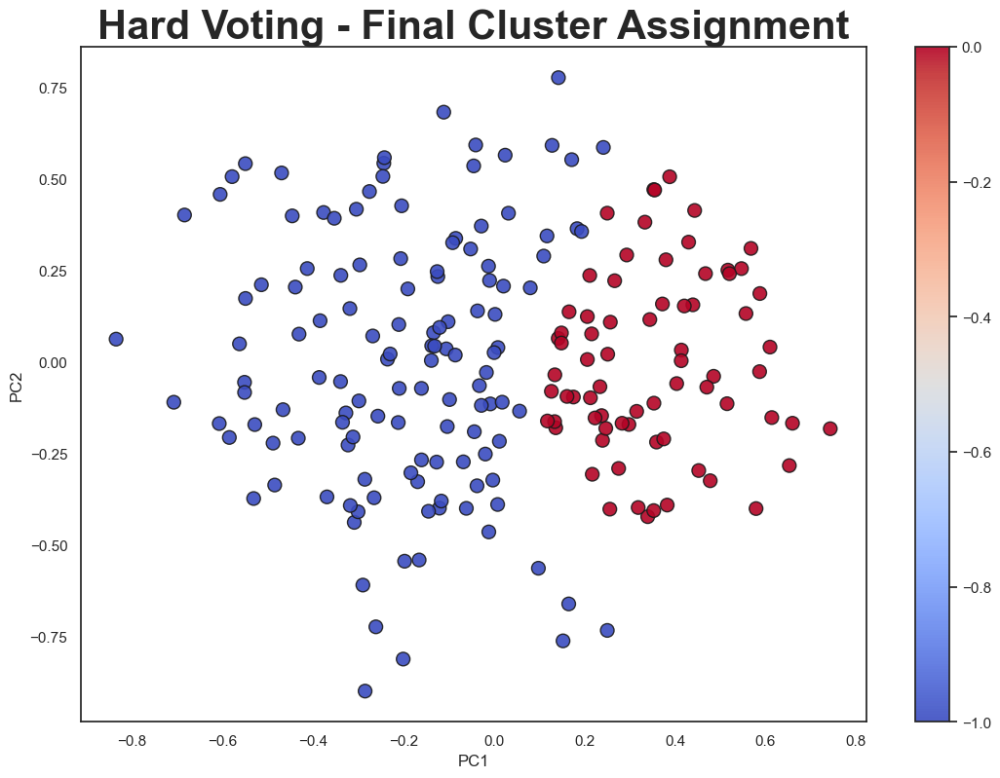

Silhouette Score: 0.316
Davies-Bouldin Index: 1.151
Calinski-Harabasz Index: 97.470


In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import MeanShift
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import hdbscan
import skfuzzy as fuzz
from scipy.stats import mode

# Simulated dataset (Replace with real scaled data)
df_scaled = np.random.rand(200, 5)  # 200 samples, 5 features

# PCA for Dimensionality Reduction
pca_final = PCA(n_components=2, random_state=42)
reduced = pca_final.fit_transform(df_scaled)
pcadf = pd.DataFrame(reduced, columns=['PC1', 'PC2'])

### HDBSCAN Clustering
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, gen_min_span_tree=True)
hdbscan_labels = hdbscan_model.fit_predict(pcadf)

### Mean Shift Clustering
mean_shift_model = MeanShift().fit(pcadf)
mean_shift_labels = mean_shift_model.labels_

### Fuzzy C-Means Clustering
n_clusters = 3
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    reduced.T, n_clusters, 2, error=0.005, maxiter=1000, init=None
)
fuzzy_labels = np.argmax(u, axis=0)

# Combine Cluster Labels into a DataFrame
ensemble_df = pd.DataFrame({
    'FuzzyCMeans': fuzzy_labels,
    'HDBSCAN': hdbscan_labels,
    'MeanShift': mean_shift_labels
})

# Hard Voting: Assign the most common label among the three clustering methods
final_labels = mode(ensemble_df, axis=1).mode.flatten()
ensemble_df['FinalCluster'] = final_labels

# Visualization of Final Clusters
plt.figure(figsize=(13, 9))
plt.title('Hard Voting - Final Cluster Assignment', weight='bold', size=30)
plt.xlabel('PC1')
plt.ylabel('PC2')
scatter = plt.scatter(pcadf['PC1'], pcadf['PC2'], c=final_labels, s=100, cmap='coolwarm', edgecolor='k', alpha=0.9)
plt.colorbar(scatter)
plt.show()

# Evaluation Metrics for Final Clusters
silhouette_avg = silhouette_score(pcadf, final_labels)
dbi = davies_bouldin_score(pcadf, final_labels)
chi = calinski_harabasz_score(pcadf, final_labels)

print(f"Silhouette Score: {silhouette_avg:.3f}")
print(f"Davies-Bouldin Index: {dbi:.3f}")
print(f"Calinski-Harabasz Index: {chi:.3f}")

In [ ]:
# Step 6: Visualization (Revised)
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('Hybrid Clustering (HDBSCAN + Fuzzy C-Means)', weight='bold', size=20)
plt.xlabel('PC1')
plt.ylabel('PC2')

# Reconstruct a label array for the full dataset
final_labels = np.zeros_like(hdbscan_labels)  # Start with all noise (Cluster 0)
non_noise_indices = hdbscan_labels != -1  # Find non-noise points
final_labels[non_noise_indices] = fcm_labels + 1  # Assign FCM clusters (shifted by +1)

# Assign colors to clusters including noise
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'], 
    c=final_labels,  # Use the reconstructed label array
    s=100, cmap='rainbow', edgecolor='k', alpha=0.9
)
plt.colorbar(scatter, label='Cluster Labels (0 = Noise)')
plt.show()

## Final Model Choice 

###  Hybrid Clustering (HDBSCAN + K-Means)
#### 1.Apply HDBSCAN to detect natural clusters.
#### 2. Use those clusters as initial centroids for K-Means.
#### 3. Evaluate using your existing metrics.

In [ ]:
# Import required libraries
import hdbscan
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming pcadf is a DataFrame with columns 'PC1' and 'PC2'
# Step 1: Initialize and fit the HDBSCAN model
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=15, gen_min_span_tree=True)
hdbscan_labels = hdbscan_model.fit_predict(pcadf)

# Step 2: Filter out noise (-1 labels in HDBSCAN)
filtered_data = pcadf[hdbscan_labels != -1]  # Only consider non-noise points
hdbscan_clusters = hdbscan_labels[hdbscan_labels != -1]

# Step 3: Use HDBSCAN clusters as initialization for K-Means
num_clusters = len(np.unique(hdbscan_clusters))  # Get actual cluster count from HDBSCAN
kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init=10, random_state=42)
kmeans_labels = kmeans.fit_predict(filtered_data)

# Step 4: Create cluster column in the original dataset `df`
df['cluster'] = 0  # Initialize all rows with 0 (noise cluster)
non_noise_indices = hdbscan_labels != -1
df.loc[non_noise_indices, 'cluster'] = kmeans_labels + 1  # Assign KMeans labels (starting from 1)

# Step 5: Evaluation Metrics
dbi = davies_bouldin_score(filtered_data, kmeans_labels)
chi = calinski_harabasz_score(filtered_data, kmeans_labels)
silhouette = silhouette_score(filtered_data, kmeans_labels)

print(f"Davies-Bouldin Index: {dbi}")
print(f"Calinski-Harabasz Index: {chi}")
print(f"Silhouette Score: {silhouette}")

In [ ]:
# Step 6: Visualization (Revised)
plt.figure(figsize=(13, 9))
sns.set_style('white')
plt.title('Hybrid Clustering (HDBSCAN + K-Means)', weight='bold', size=20)
plt.xlabel('PC1')
plt.ylabel('PC2')

# Reconstruct a label array for the full dataset
final_labels = np.zeros_like(hdbscan_labels)  # Start with all noise (Cluster 0)
non_noise_indices = hdbscan_labels != -1  # Find non-noise points
final_labels[non_noise_indices] = kmeans_labels + 1  # Assign KMeans clusters (shifted by +1)

# Assign colors to clusters including noise
scatter = plt.scatter(
    pcadf['PC1'], pcadf['PC2'], 
    c=final_labels,  # Use the reconstructed label array
    s=100, cmap='rainbow', edgecolor='k', alpha=0.9
)
plt.colorbar(scatter, label='Cluster Labels (0 = Noise)')
plt.show()


In [ ]:
# Step 7: Save the updated DataFrame
#import os
#os.makedirs('data', exist_ok=True)
#df.to_csv("./data/clustered_data.csv", index=False)